# **Problema 1: Integración analítica de flujos**

Halle las trayectorias, las líneas de corriente las trazas de una partícula ubicada en $(x_0, y_0)$ a $t = 0$, para los siguientes campos de velocidades bidimensionales:

(i) Una corriente uniforme constante $U$ superpuesta a otra corriente uniforme ortogonal a la primera. La velocidad $U'$ de la segunda corriente está modulada en forma armónica en el tiempo con período $\tau$.

(ii) Un flujo con campo de velocidad dado por
$$ \mathbf{u}(x, y, t) =  \frac{\alpha x}{1+\beta t}\mathbf{\hat{x}} + c\mathbf{\hat{y}} $$


## (i) Corrientes uniformes superpuestas

El campo de velocidades es:
$$
\mathbf{u}(x,y,t) = U\,\hat{x} + U'(t)\,\hat{y}, \quad \text{con} \quad U'(t)=U_0\cos\left(\frac{2\pi}{\tau}t\right)
$$

### Trayectorias

Las trayectorias satisfacen:
$$
\frac{dx}{dt} = U, \quad \frac{dy}{dt} = U_0\cos\left(\frac{2\pi}{\tau}t\right)
$$

Integrando con condiciones iniciales $x(0)=x_0$, $y(0)=y_0$:

$$
x(t) = x_0 + Ut
$$

$$
y(t) = y_0 + \frac{U_0\tau}{2\pi}\sin\left(\frac{2\pi}{\tau}t\right)
$$

Por lo tanto:
$$
\begin{cases}
x(t) = x_0 + Ut \\
y(t) = y_0 + \dfrac{U_0\tau}{2\pi}\sin\left(\dfrac{2\pi}{\tau}t\right)
\end{cases}
$$

### Líneas de corriente

Se obtienen de:
$$
\frac{dy}{dx} = \frac{u_y}{u_x} = \frac{U_0\cos\left(\frac{2\pi}{\tau}t\right)}{U}
$$

Para un instante fijo $t=t_0$:

$$
\frac{dy}{dx} = \frac{U_0}{U}\cos\left(\frac{2\pi}{\tau}t_0\right)
$$

Integrando:

$$
y = \frac{U_0}{U}\cos\left(\frac{2\pi}{\tau}t_0\right)x + C
$$





## (ii) Campo de velocidad dependiente del tiempo

$$
\mathbf{u}(x,y,t) = \frac{\alpha x}{1+\beta t}\hat{x} + c\,\hat{y}
$$

### Trayectorias

$$
\frac{dx}{dt} = \frac{\alpha x}{1+\beta t}, \quad \frac{dy}{dt} = c
$$

Para $x(t)$:

$$
\frac{1}{x}dx = \frac{\alpha}{1+\beta t}dt
$$

$$
\ln x = \frac{\alpha}{\beta}\ln(1+\beta t) + C
$$

$$
x(t) = x_0(1+\beta t)^{\alpha/\beta}
$$

Para $y(t)$:

$$
y(t) = y_0 + ct
$$

Resultado:

$$
\begin{cases}
x(t) = x_0(1+\beta t)^{\alpha/\beta} \\
y(t) = y_0 + ct
\end{cases}
$$

### Líneas de corriente

$$
\frac{dy}{dx} =  \frac{u_y}{u_x} =\frac{c(1+\beta t)}{\alpha x}
$$

Para $t=t_0$:

$$
\frac{dy}{dx} = \frac{c(1+\beta t_0)}{\alpha x}
$$

$$
y = \frac{c(1+\beta t_0)}{\alpha}\ln x + C
$$


Con los resultados analiticos podemos empezar a escribir el codigo, primero empezamos definiendo los distintas funciones a utilizar

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

#========================== PARAMETROS FISICOS =======================
U_const = 1.0
U_amp = 1.5
tau = 2.0

alpha = 1.0
beta = 0.5
c = 1.0
#========================== CAMPOS DE VELOCIDADES =======================
def campo_1(X, t):
    """Campo de velocidades (i)"""
    u_x = U_const
    u_y = U_amp * np.cos(2 * np.pi * t / tau)
    return np.array([u_x, u_y])

def campo_2(X, t):
    """Campo de velocidades (ii)"""
    x = X[0]
    # Se evita división por cero si beta*t != -1
    u_x = (alpha * x) / (1 + beta * t)
    u_y = c
    return np.array([u_x, u_y])
    # Parámetros de integración

# ====================== SOLUCIONES ANALÍTICAS EXACTAS ======================
def exact_1(t, x0=1.0, y0=1.0):
    """Solución exacta Campo (i)"""
    x = x0 + U_const * t
    y = y0 + (U_amp * tau / (2 * np.pi)) * np.sin(2 * np.pi * t / tau)
    return np.array([x, y])

def exact_2(t, x0=1.0, y0=1.0):
    """Solución exacta Campo (ii)"""
    x = x0 * (1 + beta * t)**(alpha / beta)
    y = y0 + c * t
    return np.array([x, y])

# ====================== ESQUEMAS DE INTEGRACIÓN ======================
def esquema_euler(X, u, t, dt):
    """Euler explícito (el que ya tenías)"""
    return X + u(X, t) * dt

def esquema_rk4(X, u, t, dt):
    """Runge-Kutta orden 4"""
    k1 = u(X, t)
    k2 = u(X + 0.5*dt*k1, t + 0.5*dt)
    k3 = u(X + 0.5*dt*k2, t + 0.5*dt)
    k4 = u(X + dt*k3, t + dt)
    return X + (dt/6.0) * (k1 + 2*k2 + 2*k3 + k4)

# ====================== FUNCIÓN DE TRAYECTORIA  ======================
def trayectoria(X0, u, N, dt, esquema):
    """Calcula trayectoria usando el esquema que se use"""
    ts = np.arange(0, N+1) * dt
    Xs = np.zeros((N+1, 2))
    Xs[0] = X0
    for j in range(N):
        Xs[j+1] = esquema(Xs[j], u, ts[j], dt)
    return ts, Xs



Notar que utilizamos dos esquemas de integracion numerica, esto con el objetivo de compararlos y ver cual tiene mejor desempeño en problemas de fluidos. (Por consistencia RK4 debe tener un error menor dado que este esta en el quinto orden)
Por tanto usamos las soluciones exacatas anteriormente calculadas para esto, finalmente graficamos las trayectorias con todos los metodos y printeamos los resultados del error.

Campo (i)  → Error máx Euler: 1.50e-02   |   RK4: 1.61e-10
Campo (ii) → Error máx Euler: 1.49e-01   |   RK4: 1.40e-09


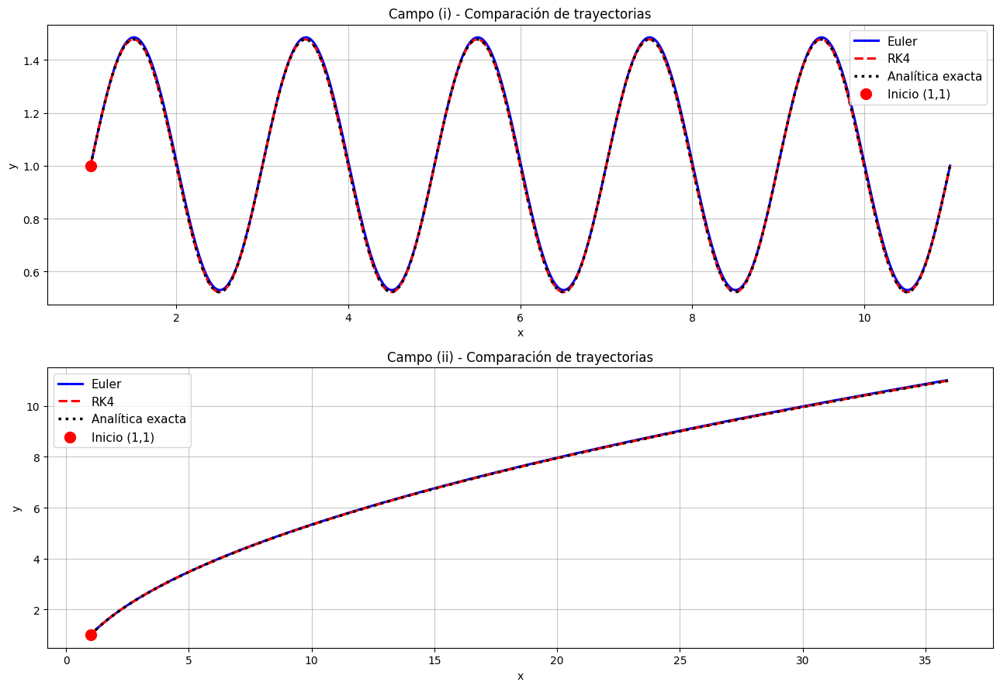

In [ ]:
# ====================== PARÁMETROS ======================
dt = 0.01
N = 1000          
X0 = np.array([1.0, 1.0])

# ====================== CÁLCULO DE TRAYECTORIAS ======================
# Campo (i)
ts, Xs_euler1 = trayectoria(X0, campo_1, N, dt, esquema_euler)
ts, Xs_rk41   = trayectoria(X0, campo_1, N, dt, esquema_rk4)
exact1 = np.array([exact_1(t) for t in ts])

# Campo (ii)
ts, Xs_euler2 = trayectoria(X0, campo_2, N, dt, esquema_euler)
ts, Xs_rk42   = trayectoria(X0, campo_2, N, dt, esquema_rk4)
exact2 = np.array([exact_2(t) for t in ts])

# ====================== ERRORES ======================
error_euler1 = np.linalg.norm(Xs_euler1 - exact1, axis=1).max()
error_rk41   = np.linalg.norm(Xs_rk41   - exact1, axis=1).max()
error_euler2 = np.linalg.norm(Xs_euler2 - exact2, axis=1).max()
error_rk42   = np.linalg.norm(Xs_rk42   - exact2, axis=1).max()

print(f"Campo (i)  → Error máx Euler: {error_euler1:.2e}   |   RK4: {error_rk41:.2e}")
print(f"Campo (ii) → Error máx Euler: {error_euler2:.2e}   |   RK4: {error_rk42:.2e}")

# ====================== GRÁFICOS DE LAS 4 TRAYECTORIAS ======================
fig, axs = plt.subplots(2, 1, figsize=(13, 9))

# Campo (i)
axs[0].plot(Xs_euler1[:,0], Xs_euler1[:,1], 'b-',  label='Euler', linewidth=2.2)
axs[0].plot(Xs_rk41[:,0],   Xs_rk41[:,1],   'r--', label='RK4',   linewidth=2.2)
axs[0].plot(exact1[:,0],    exact1[:,1],    'k:',  label='Analítica exacta', linewidth=2.5)
axs[0].scatter(X0[0], X0[1], color='red', s=100, zorder=5, label='Inicio (1,1)')
axs[0].set_title('Campo (i) - Comparación de trayectorias')
axs[0].set_xlabel('x')
axs[0].set_ylabel('y')
axs[0].grid(True, alpha=0.7)
axs[0].legend(fontsize=11)

# Campo (ii)
axs[1].plot(Xs_euler2[:,0], Xs_euler2[:,1], 'b-',  label='Euler', linewidth=2.2)
axs[1].plot(Xs_rk42[:,0],   Xs_rk42[:,1],   'r--', label='RK4',   linewidth=2.2)
axs[1].plot(exact2[:,0],    exact2[:,1],    'k:',  label='Analítica exacta', linewidth=2.5)
axs[1].scatter(X0[0], X0[1], color='red', s=100, zorder=5, label='Inicio (1,1)')
axs[1].set_title('Campo (ii) - Comparación de trayectorias')
axs[1].set_xlabel('x')
axs[1].set_ylabel('y')
axs[1].grid(True, alpha=0.7)
axs[1].legend(fontsize=11)

plt.tight_layout()
plt.show()

Tal como podemos ver todos los metodos convergen correctamente a la solucion analitica, siendo RK4 el esquema con mejor convergencia numerica tal como predijimos antes, sin embargo si aumentamos dt el error de los metodos deberia ser mas evidenciable, para ello:

Campo (i)  → Error máx Euler: 3.00e-01   |   RK4: 2.49e-05
Campo (ii) → Error máx Euler: 9.18e+02   |   RK4: 5.63e-02


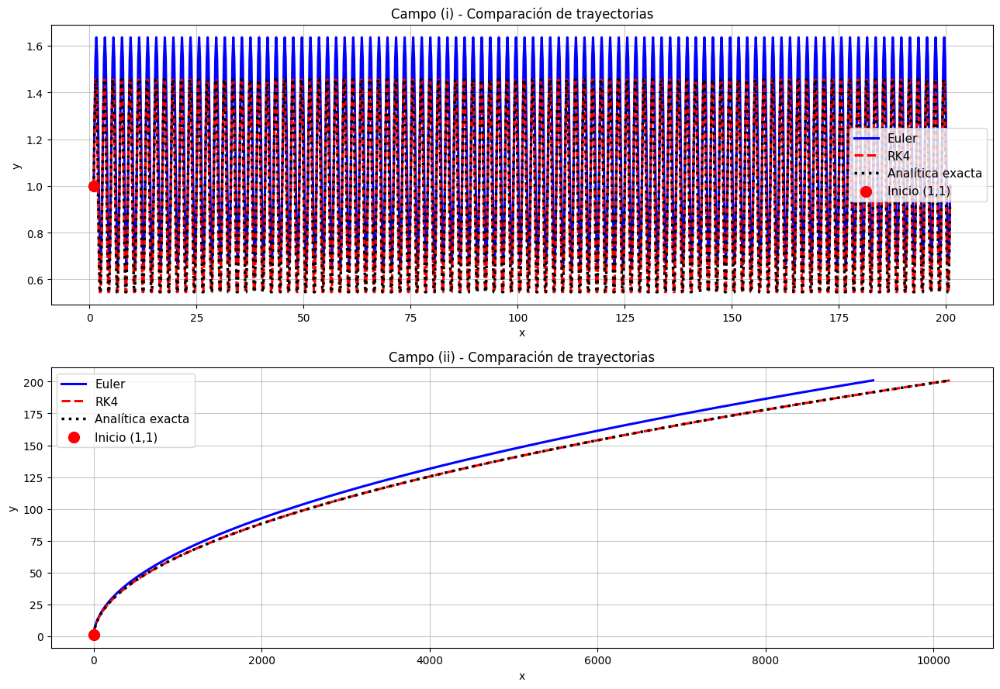

In [ ]:
# ====================== PARÁMETROS ======================
dt = 0.2
N = 1000
X0 = np.array([1.0, 1.0])

# ====================== CÁLCULO DE TRAYECTORIAS ======================
# Campo (i)
ts, Xs_euler1 = trayectoria(X0, campo_1, N, dt, esquema_euler)
ts, Xs_rk41   = trayectoria(X0, campo_1, N, dt, esquema_rk4)
exact1 = np.array([exact_1(t) for t in ts])

# Campo (ii)
ts, Xs_euler2 = trayectoria(X0, campo_2, N, dt, esquema_euler)
ts, Xs_rk42   = trayectoria(X0, campo_2, N, dt, esquema_rk4)
exact2 = np.array([exact_2(t) for t in ts])

# ====================== ERRORES ======================
error_euler1 = np.linalg.norm(Xs_euler1 - exact1, axis=1).max()
error_rk41   = np.linalg.norm(Xs_rk41   - exact1, axis=1).max()
error_euler2 = np.linalg.norm(Xs_euler2 - exact2, axis=1).max()
error_rk42   = np.linalg.norm(Xs_rk42   - exact2, axis=1).max()

print(f"Campo (i)  → Error máx Euler: {error_euler1:.2e}   |   RK4: {error_rk41:.2e}")
print(f"Campo (ii) → Error máx Euler: {error_euler2:.2e}   |   RK4: {error_rk42:.2e}")

# ====================== GRÁFICOS DE LAS 4 TRAYECTORIAS ======================
fig, axs = plt.subplots(2, 1, figsize=(13, 9))

# Campo (i)
axs[0].plot(Xs_euler1[:,0], Xs_euler1[:,1], 'b-',  label='Euler', linewidth=2.2)
axs[0].plot(Xs_rk41[:,0],   Xs_rk41[:,1],   'r--', label='RK4',   linewidth=2.2)
axs[0].plot(exact1[:,0],    exact1[:,1],    'k:',  label='Analítica exacta', linewidth=2.5)
axs[0].scatter(X0[0], X0[1], color='red', s=100, zorder=5, label='Inicio (1,1)')
axs[0].set_title('Campo (i) - Comparación de trayectorias')
axs[0].set_xlabel('x')
axs[0].set_ylabel('y')
axs[0].grid(True, alpha=0.7)
axs[0].legend(fontsize=11)

# Campo (ii)
axs[1].plot(Xs_euler2[:,0], Xs_euler2[:,1], 'b-',  label='Euler', linewidth=2.2)
axs[1].plot(Xs_rk42[:,0],   Xs_rk42[:,1],   'r--', label='RK4',   linewidth=2.2)
axs[1].plot(exact2[:,0],    exact2[:,1],    'k:',  label='Analítica exacta', linewidth=2.5)
axs[1].scatter(X0[0], X0[1], color='red', s=100, zorder=5, label='Inicio (1,1)')
axs[1].set_title('Campo (ii) - Comparación de trayectorias')
axs[1].set_xlabel('x')
axs[1].set_ylabel('y')
axs[1].grid(True, alpha=0.7)
axs[1].legend(fontsize=11)

plt.tight_layout()
plt.show()

Tal como vimos el metodo de euler no converge correctamente para tiempos de integracion muy largos, siendo RK4 un metodo mucho mas confiable

# **Problema 2: Integración numérica de flujos**

Considere los siguientes campos de velocidad dependientes del tiempo $\mathbf{u}(\mathbf{x}, t)$ en el caso bidimensional $\mathbf{x} = x~\mathbf{\hat{x}}+ y~\mathbf{\hat{y}}$.
En cada caso, adimensionalice los campos y calcule numéricamente las trayectorias y la evolución de las líneas de corriente eligiendo puntos de colocación iniciales más apropiados para el flujo en cuestión:

(i) Una fuente lineal de caudal constante $Q$ superpuesta a una corriente uniforme cuya velocidad aumenta linealmente con el tiempo $U(t) = \gamma_0 t$.

(ii) Una fuente lineal de caudal constante $Q$ superpuesta a un torbellino cuya circulación $\Gamma$ decrece exponencialmente con un tiempo característico $\tau$.
_Ayuda: Tras adimensionalizar quedará un parámetro libre. Bárralo para estudiar los distintos regímenes._

(iii) Una fuente lineal de caudal constante $Q$ superpuesta a una corriente uniforme oscilante con velocidad $U(t) = U_0\cos(\omega t)$.


En este problema nos piden calcular numéricamente las trayectorias y las lineas de corriente para cada campo, además debemos adimensionalizar los mismo realizando el cambio de variable adecuado, comencemos.

**i**Tenemos un campo compuesto por uno que va como $\thicksim$ $\gamma_0 t$ y su otra componente ortogonal como $\thicksim \frac{1}{r}$ por lo tanto el campo que tenemos es: 
$$
u(x,y,t) = (\frac{Qx}{2\pi(x^2+y^2)}+\gamma_0t) \hat{x}+\frac{Qy}{2\pi(x^2+y^2)}\hat{y}
$$


Ahora procedemos con la adimensionalizacion del campo.


Para eso definimos $m \equiv \frac{Q}{2\pi}$. La componente en $x$ de la velocidad queda:

$$u_x = \frac{m x}{x^2+y^2} + \gamma_0 t$$

Luego proponemos un sistema con escalas características $L_c$ (longitud), $T_c$ (tiempo) y $U_c$ (velocidad), tal que:

$$x = L_c x', \quad y = L_c y', \quad t = T_c t', \quad u_x = U_c u_x'$$

Sustituyendo en la ecuación de $u_x$:

$$U_c u_x' = m \frac{L_c x'}{L_c^2 (x'^2+y'^2)} + \gamma_0 T_c t' \implies u_x' = \left(\frac{m}{U_c L_c}\right) \frac{x'}{x'^2+y'^2} + \left(\frac{\gamma_0 T_c}{U_c}\right) t'$$

Para que la ecuación sea adimensional exigimos que las cantidades entre paréntesis sean la unidad, junto con:
$$U_c = \frac{m}{L_c}, \quad U_c = \gamma_0 T_c, \quad U_c = \frac{L_c}{T_c}$$

Igualando expresiones:

$$\frac{L_c}{T_c} = \gamma_0 T_c \implies L_c = \gamma_0 T_c^2$$

$$\frac{m}{L_c} = \gamma_0 T_c \implies \frac{m}{\gamma_0 T_c^2} = \gamma_0 T_c \implies m = \gamma_0^2 T_c^3$$

Despejando las escalas fundamentales:

$$\implies \boxed{ T_c = \left(\frac{m}{\gamma_0^2}\right)^{1/3} } \quad \text{y} \quad \boxed{ L_c = m^{1/3} \gamma_0^{-2/3} }$$

entonces, obtenemos el campo adimensionalizado:

$$\implies { \vec{U}' = \left( \frac{x'}{x'^2+y'^2} + t' \right) \hat{x} + \frac{y'}{x'^2+y'^2} \hat{y} }$$
Por comodidad usaremos las variables sin primar:

$$\implies \boxed{ \vec{U} = \left( \frac{x}{x^2+y^2} + t' \right) \hat{x} + \frac{y}{x^2+y^2} \hat{y} }$$

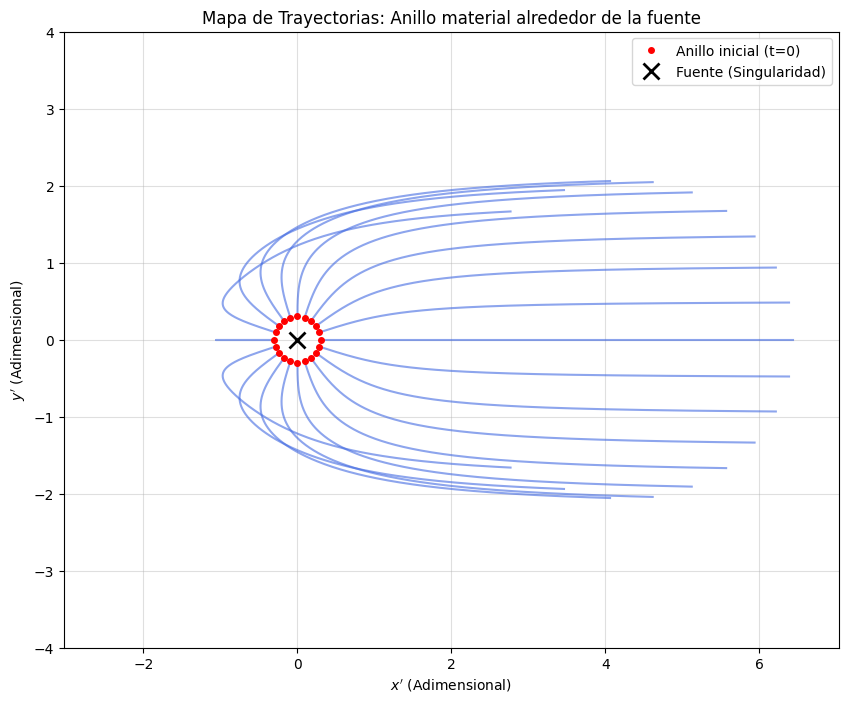

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def esquema(X, u, t, dt):
    """
    Calcula X(t+dt) a partir de X(t) y el campo de velocidades.
    """
    return X + u(X, t) * dt

def trayectoria(X0, u, N, dt):
    """
    Calcula numéricamente la solución a dX/dt = u(X,t)
    """
    d = X0.shape[0]
    ts = np.arange(0, N+1)*dt
    Xs = np.zeros((N+1, d))
    Xs[0] = X0

    for j in range(N):
        Xs[j+1] = esquema(Xs[j], u, ts[j], dt)

    return ts, Xs

def campo_u_inciso_i(X, t):
    """
    Campo de velocidades adimensionalizado:
    ux = x/(x^2+y^2) + t
    uy = y/(x^2+y^2)
    """
    x, y = X[0], X[1]
    r2 = x**2 + y**2

    if r2 < 1e-8:
        r2 = 1e-8

    ux = x / r2 + t
    uy = y / r2

    return np.array([ux, uy])

if __name__ == "__main__":
    dt = 0.01
    N = 300  # Simulamos hasta t = 3.0

    plt.figure(figsize=(10, 8))

    #quiero un anillo de condiciones iniciales
    radio_inicial = 0.3        # Qué tan lejos de la fuente arranca el anillo
    num_particulas = 20       # Cantidad de partículas a simular


    angulos = np.linspace(0, 2 * np.pi, num_particulas, endpoint=False)

    condiciones_iniciales = []
    for theta in angulos:
        x0 = radio_inicial * np.cos(theta)
        y0 = radio_inicial * np.sin(theta)
        condiciones_iniciales.append(np.array([x0, y0]))

    # ==========================================

    # Bucle para calcular y graficar cada trayectoria
    for i, X0 in enumerate(condiciones_iniciales):
        ts, Xs = trayectoria(X0, campo_u_inciso_i, N, dt)

        plt.plot(Xs[:, 0], Xs[:, 1], '-', color='royalblue', alpha=0.6)

        # Marcamos las posiciones iniciales (formarán el anillo)
        if i == 0:
            plt.plot(X0[0], X0[1], 'ro', markersize=4, label='Anillo inicial (t=0)')
        else:
            plt.plot(X0[0], X0[1], 'ro', markersize=4)

    # Marcamos la fuente
    plt.plot(0, 0, 'kx', markersize=12, markeredgewidth=2, label='Fuente (Singularidad)')

    plt.xlabel(r"$x'$ (Adimensional)")
    plt.ylabel(r"$y'$ (Adimensional)")
    plt.title("Mapa de Trayectorias: Anillo material alrededor de la fuente")
    plt.grid(True, alpha=0.4)
    plt.legend()
    plt.axis('equal')

    plt.xlim(-6, 10)
    plt.ylim(-4, 4)

    plt.show()



Luego, procedemos a calcular las lineas de corriente:

In [2]:

import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider

# --- 2. Motor Numérico y Modelo Físico ---
def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def linea_de_corriente(l0, u, t, N, ds):
    d = l0.shape[0]
    s = np.arange(0, N+1)*ds
    ls = np.zeros((N+1, d))
    ls[0] = l0

    u_lc = lambda x, _: u(x, t)
    for j in range(N):
        ls[j+1] = esquema(ls[j], u_lc, t, ds)
    return s, ls

def campo_adimensional(X, t):
    x, y = X[0], X[1]
    r2 = x**2 + y**2
    if r2 < 1e-4: # Manejo de singularidad
        return np.array([0.0, 0.0])
    u_x = (x / r2) + t
    u_y = (y / r2)
    return np.array([u_x, u_y])

# --- 3. Condiciones Iniciales Estratégicas ---
thetas = np.linspace(0, 2*np.pi, 20, endpoint=False)
radio_emision = 0.05
l0s_fuente = [np.array([radio_emision*np.cos(th), radio_emision*np.sin(th)]) for th in thetas]
l0s_borde = [np.array([-1.5, y]) for y in np.linspace(-1.5, 1.5, 15)]
l0s = np.array(l0s_fuente + l0s_borde)

N_pasos = 400
ds = 0.01

# --- 4. Motor de Renderizado ---
# Esta función recalcula y redibuja la física para un t_val específico
def graficar_frame(t_val):
    plt.figure(figsize=(7, 7))

    for l0 in l0s:
        _, ls = linea_de_corriente(l0, campo_adimensional, t_val, N_pasos, ds)
        plt.plot(ls[:,0], ls[:,1], color='blue', alpha=0.6)

    # Marcador de la singularidad como PUNTO ('ro')
    plt.plot(0, 0, 'ro', markersize=6, label='Fuente (Singularidad)')

    plt.xlim(-1.5, 1.5)
    plt.ylim(-1.5, 1.5)
    plt.xlabel(r'Coordenada adimensional $\tilde{x}$')
    plt.ylabel(r'Coordenada adimensional $\tilde{y}$')
    plt.title(f'Evolución Topológica de Líneas de Corriente a $\\tilde{{t}} = {t_val:.2f}$')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.show() # Fundamental: ipywidgets intercepta este show() para actualizar el cuadro

# --- 5. Interfaz Interactiva ---
deslizador = FloatSlider(value=0.0, min=0.0, max=5.0, step=0.1, description='Tiempo t:')
interact(graficar_frame, t_val=deslizador)

interactive(children=(FloatSlider(value=0.0, description='Tiempo t:', max=5.0), Output()), _dom_classes=('widg…

<function __main__.graficar_frame(t_val)>

Podemos observar que a medida que avanza el tiempo el termino dependiete del tiempo se vuelve dominante, venciendo la resulpsion radial de la fuente.

Punto **ii)**

Ahora nos dan un campo Una fuente lineal de caudal constante $Q$ superpuesta a un torbellino cuya circulación  $Γ$  decrece exponencialmente con un tiempo
Por lo tanto el campo dimensionalizado se puede escribir como: $$\vec{U}(x; y; t) = \frac{1}{2\pi(x^2+y^2)} \left[ \left( Qx - y\Gamma e^{-\frac{t}{\tau}} \right)\hat{x} + \left( Qy + x\Gamma e^{-\frac{t}{\tau}} \right)\hat{y} \right]$$

Ahora procedemos con la adimensionalización de la componente $x$ del campo:

$$u_x(x;y;t) = \frac{Qx - y\Gamma e^{-\frac{t}{\tau}}}{2\pi(x^2+y^2)}$$

 Paso **1) Cambio de variable:**
Proponemos las siguientes relaciones entre las variables dimensionales y las adimensionales (primadas):

$$
\begin{cases}
x = L_c x' \\
y = L_c y' \\
t = T_c t' \\
u_x = U_c u_x'
\end{cases}
$$

 Paso 2) **Reemplazo en el campo original:**


$$U_c u_x' = \frac{Q L_c x' - y' L_c \Gamma e^{-\frac{t' T_c}{\tau}}}{2\pi(L_c^2 x'^2 + L_c^2 y'^2)}$$

Distribuyendo y simplificando un factor $L_c$:

$$\implies u_x' = \frac{Q x'}{2\pi U_c L_c (x'^2+y'^2)} - \frac{y' \Gamma e^{-\frac{t}{\tau}}}{2\pi U_c L_c (x'^2+y'^2)}$$

$\implies$ Para adimensionalizar, **se debe cumplir que**:

$$
\begin{cases}
1) \quad \frac{Q}{2\pi U_c L_c} = 1 \\
\\
2) \quad \frac{T_c}{\tau} = 1 \implies T_c = \tau \\
\\
3) \quad U_c = \frac{L_c}{T_c}
\end{cases}
$$

Meto la condición cinemática 3) en 1):

$$\frac{Q T_c}{2\pi L_c L_c} = \frac{Q \tau}{2\pi L_c^2} = 1 \implies L_c = \sqrt{\frac{Q \tau}{2\pi}}$$

Luego reemplazo por las variables adimensionalizadas en el campo. Sabiendo que $2\pi L_c U_c = Q$ y que $t/\tau = t'$:

$$u_x' = \frac{Q}{2\pi L_c U_c} \frac{x'}{(x'^2+y'^2)} - \frac{\Gamma}{2\pi L_c U_c} \frac{y' e^{-t'}}{(x'^2+y'^2)}$$

$$u_x' = x' \frac{1}{(x'^2+y'^2)} - y' \frac{\Gamma}{Q} \frac{e^{-t'}}{(x'^2+y'^2)}$$



Observamos que queda un parametro libre, entonces definimos $\lambda = \frac{\Gamma}{Q}$ como una relación que dice que tan fuerte es la repulsión de la funte lineal comparada con la fuerza que hace rotar al líquido. Si $\lambda \ll1$ entonces estamos en un régimen donde la fuerza de repulsion es mucho mayor al giro, por lo tanto, el campo se reduce al de una fuente lineal sin rotación.

La componente $x$ del campo quedaria:

$${ u_x' = \frac{1}{x'^2+y'^2} \left( x' - \lambda y' e^{-t'} \right) } \quad$$

Extendiendo el mismo análisis de forma análoga para la componente en $y$, el campo vectorial completo resulta:

$$\boxed{\vec{U}(x;y;t) = \frac{1}{x'^2+y'^2} \left[ (x' - \lambda y' e^{-t'}) \hat{x} + (y' + \lambda x' e^{-t'}) \hat{y} \right]}$$
Ya tenemos nuestro campo adimensionalizado listo para hallar las trayectorias y lineas de corrientes. Comencemos con las primeras:

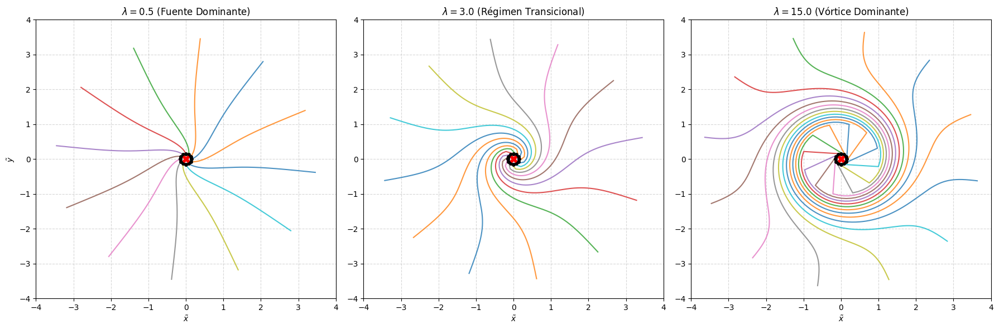

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Motor de Integración ---
def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def trayectoria(X0, u, N, dt):
    d = X0.shape[0]
    ts = np.arange(0, N+1)*dt
    Xs = np.zeros((N+1, d))
    Xs[0] = X0
    for j in range(N):
        Xs[j+1] = esquema(Xs[j], u, ts[j], dt)
    return ts, Xs

# --- 2. Modelo Físico Parametrizado ---
def campo_ii(X, t, lam):
    """
    Campo adimensional: Fuente + Torbellino decadente.
    lam (lambda) es el parámetro libre: (Fuerza del Vórtice / Caudal).
    """
    x, y = X[0], X[1]
    r2 = x**2 + y**2

    # Softening para la singularidad central
    denom = r2 + 1e-4

    # Término de fuente (radial)
    u_r_x = x / denom
    u_r_y = y / denom

    # Término de vórtice (azimutal) con decaimiento temporal
    decaimiento = np.exp(-t)
    u_theta_x = (-y / denom) * decaimiento
    u_theta_y = (x / denom) * decaimiento

    # Superposición
    u_x = u_r_x + lam * u_theta_x
    u_y = u_r_y + lam * u_theta_y

    return np.array([u_x, u_y])

# --- 3. Parámetros de Simulación e Inyección ---
N_pasos = 600
dt = 0.01

# Inyección radial: un pequeño anillo de partículas cerca del origen
radio_inyeccion = 0.15
thetas = np.linspace(0, 2*np.pi, 12, endpoint=False)
l0s = np.array([[radio_inyeccion * np.cos(th), radio_inyeccion * np.sin(th)] for th in thetas])

# Definimos los regímenes que queremos estudiar
lambdas_a_evaluar = [0.5, 3.0, 15.0]
titulos = [
    r'$\lambda = 0.5$ (Fuente Dominante)',
    r'$\lambda = 3.0$ (Régimen Transicional)',
    r'$\lambda = 15.0$ (Vórtice Dominante)'
]

# --- 4. Bucle de Integración y Visualización ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, lam in enumerate(lambdas_a_evaluar):
    ax = axes[idx]

    # Envolvemos el campo con una función lambda de Python para fijar el parámetro lam
    # y que la función 'trayectoria' solo vea las variables X y t.
    campo_fijado = lambda X, t: campo_ii(X, t, lam)

    for i in range(l0s.shape[0]):
        ts, Xs = trayectoria(l0s[i], campo_fijado, N_pasos, dt)
        ax.plot(Xs[0,0], Xs[0,1], "ko", markersize=4, zorder=3) # Punto de inicio
        ax.plot(Xs[:,0], Xs[:,1], "-", alpha=0.8)               # Trayectoria

    ax.plot(0, 0, 'rX', markersize=8, zorder=4) # Singularidad

    ax.set_xlim(-4, 4)
    ax.set_ylim(-4, 4)
    ax.set_xlabel(r'$\tilde{x}$')
    if idx == 0: ax.set_ylabel(r'$\tilde{y}$')
    ax.set_title(titulos[idx])
    ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

Podemos observar que los casos limites, donde $\lambda$ es muy chico o muy grande, obetenemos lo esperado según nuestra prediccion anterior. En efecto, si $\lambda \ll1$ entonces el campo se reduce a $$\vec{U}(x;y;t) = \frac{1}{x^2+y^2} \left[ x' \hat{x} + y' \hat{y} \right] = \frac{x' \hat{x}}{x^2+y^2} + \frac{y' \hat{y}}{x^2+y^2}$$

Que corresponde al campo de una fuente lineal adimensionalizado. Si $\lambda$ es apreciable entonces en $t=0$ el movimiento será puramente rotacional, tendiendo asitoticamente al campo de una fuente lineal.
Pasemos ahora a las lineas de corrientes.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# --- 1. Funciones de Integración Numérica ---
def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def linea_de_corriente(l0, u, t, N, ds):
    d = l0.shape[0]
    s = np.arange(0, N+1)*ds
    ls = np.zeros((N+1, d))
    ls[0] = l0
    u_lc = lambda x, _: u(x, t)
    for j in range(N):
        ls[j+1] = esquema(ls[j], u_lc, t, ds)
    return s, ls

# campo adimensionalizado
def campo_ii(X, t):
    """Fuente + Torbellino decadente (lambda = 5.0)"""
    lam = 5.0
    x, y = X[0], X[1]
    r2 = x**2 + y**2
    denom = r2 + 1e-4  # Softening

    u_r_x = x / denom
    u_r_y = y / denom

    decaimiento = np.exp(-t)
    u_theta_x = (-y / denom) * decaimiento
    u_theta_y = (x / denom) * decaimiento

    u_x = u_r_x + lam * u_theta_x
    u_y = u_r_y + lam * u_theta_y
    return np.array([u_x, u_y])

def evolucionar_lineas(l0s, ts, u, N, ds, ext=None, figsize=None):
    n = l0s.shape[0]   # Cantidad de líneas de corriente
    m = ts.shape[0]    # Cantidad de tiempos (fotogramas)
    ls = np.zeros((m, n, N+1, 2))

    for i in range(m):
        for j in range(n):
            _, ls[i,j] = linea_de_corriente(l0s[j], u, ts[i], N, ds)

    xs = ls[:,:,:,0]
    ys = ls[:,:,:,1]

    if ext is None:
        extent = [np.min(np.array(xs)), np.max(np.array(xs)),
                  np.min(np.array(ys)), np.max(np.array(ys))]
    else:
        extent = ext

    # Guardo el estado de plt
    params_viejos = plt.rcParams.copy() # Corrección para evitar modificar el original
    plt.rc('animation', html='jshtml')

    fig, ax = plt.subplots(1, 1, figsize=figsize, constrained_layout=True)
    plt.close()  # Cerrar la figura, animation va a crear la suya propia

    # Inicializo las curvas
    plots = [ ax.plot([], [], "b-")[0] for i in range(n) ]
    dots  = [ ax.plot([], [], "ko")[0] for i in range(n) ]
    ax.set_title("$t=0$")
    ax.set_xlabel("x")
    ax.set_ylabel("y")

    def init():
        sup = 0
        for i, (x, y) in enumerate(zip(xs[0], ys[0])):
            dots[i].set_xdata([x[0]])
            dots[i].set_ydata([y[0]])
            sup = max(sup, max(np.max(np.abs(x)), np.max(np.abs(y))))

        ax.set_aspect('equal')
        ax.set_xlim(extent[0], extent[1])
        ax.set_ylim(extent[2], extent[3])
        return plots + dots

    def actualizar(t):
        print(f"\rCalculando fotograma {t+1} de {m}", end="")
        for i, (x, y) in enumerate(zip(xs[t], ys[t])):
            plots[i].set_xdata(x)
            plots[i].set_ydata(y)
        ax.set_title(f"Líneas de Corriente a $t={ts[t]:.2f}$")
        return plots + dots

    anim = animation.FuncAnimation(fig, actualizar, init_func=init,
                                   frames=range(0, m), blit=True, repeat=True)

    # Restauro el estado de plt (Corrección de sintaxis)
    plt.rcParams.update(params_viejos)

    return anim

radios = 0.18
thetas = np.linspace(0, 2*np.pi, 20, endpoint=False)
l0s = np.array([[radios * np.cos(th), radios * np.sin(th)] for th in thetas])

# fotrogramas)
ts = np.linspace(0, 4.0, 40)

# Parámetros espaciales
N = 300
ds = 0.02
limites = [-3.5, 3.5, -3.5, 3.5]
animacion = evolucionar_lineas(l0s, ts, campo_ii, N, ds, ext=limites, figsize=(6,6))
HTML(animacion.to_jshtml())

Calculando fotograma 40 de 40

Continuamos con el insiso **iii)** Ahora nos dan un campo producido por una fuente lineal superpuesto con uno que varia sinusoidalmente en el tiempo. Por lo tanto la forma del campo total dimensionalizado es:  

$$\vec{U}(x;y;t) = \left[ \frac{Qx}{2\pi(x^2+y^2)} + U_0 \sin(\omega t) \right] \hat{x} + \frac{Qy}{2\pi(x^2+y^2)} \hat{y}$$

Proseguimos a adimensionalizar como siempre. Primero lo hacemos para la componente $U_x$:



Partimos del campo de velocidades:
$$\vec{U}(x;y;t) = \left[ \frac{Qx}{2\pi(x^2+y^2)} + U_0 \text{sen}(\omega t) \right] \hat{x} + \frac{Qy}{2\pi(x^2+y^2)} \hat{y}$$

1) **El primer paso es proponer un cambio de variable**:

empezamos adimensionalizando la componente $U_x$, esta es:
$$U_x(x;y;t) =  \frac{Qx}{2\pi(x^2+y^2)} + U_0 \sin(\omega t)$$


Luego porpnemos los cambios de variables:
\begin{cases}
U_x = u_c U_x' \\
x = x' L_c \\
y = y' L_c \\
t = t' T_c
\end{cases}


Luego, reemplazamos estos cambios en el campo quedandonos:

$$\Rightarrow U_x' = \frac{Q x'}{2\pi L_c u_c(x'^2+y'^2)} + \frac{U_0}{u_c} \text{sen}(\omega t' T_c)$$

Busco adimensionalizar $\Rightarrow$ se debe cumplir:

$$
\begin{cases}
(1) \quad u_c = \frac{L_c}{T_c} \\
(2) \quad \frac{U_0}{u_c} = 1 \Rightarrow u_c = U_0 \\
(3) \quad T_c \omega = 1 \Rightarrow T_c = \frac{1}{\omega}
\end{cases}
$$

De la relación cinemática y los reemplazos:
$$U_c = \frac{L_c}{T_c} \Rightarrow L_c = U_c \cdot T_c = \frac{U_0}{\omega}$$

Reemplazando en el coeficiente que acompaña a la fuente:
$$\frac{Q}{2\pi L_c U_0} \Rightarrow \frac{Q \omega}{2\pi U_0^2}$$
Nuevamente obtuvimos un termino que no se cancela con nada, entonces lo nombramos como $\lambda$:


  $$\lambda \equiv \frac{Q \omega}{2\pi U_0^2}$$


  Reemplazamos en $U_x$

$$\Rightarrow U_x' = \frac{\lambda x'}{(x'^2+y'^2)} + \text{sen}(t')$$


Debido a la simetría entre las variables la adimensionalización en $U_y$ es completamente analoga, obviando las variables primadas el nuevo campo total queda:


$$\boxed{ \vec{U}(x;y;t) = \left[ \frac{\lambda x}{(x^2+y^2)} + \text{sen}(t) \right] \hat{x} + \frac{\lambda y}{x^2+y^2} \hat{y} }$$

Ya tenemos nuestro campo listo para hallar las trayectorias y lineas de corrientes, como costumbre de casa comencemos con las trayectorias:

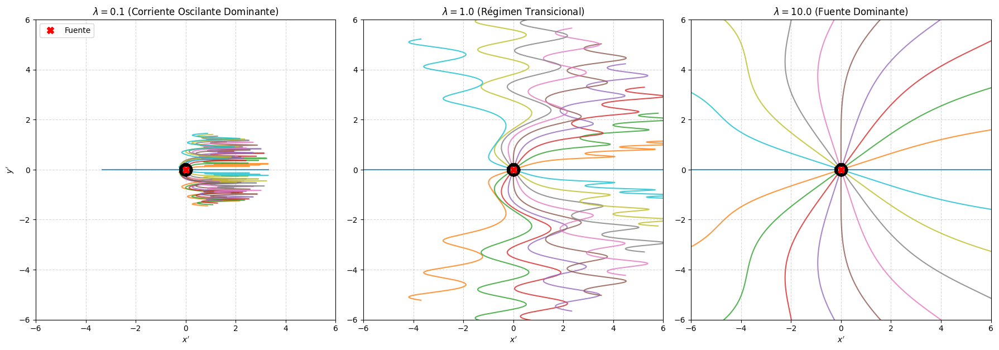

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Motor de Integración ---
def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def trayectoria(X0, u, N, dt):
    d = X0.shape[0]
    ts = np.arange(0, N+1)*dt
    Xs = np.zeros((N+1, d))
    Xs[0] = X0
    for j in range(N):
        Xs[j+1] = esquema(Xs[j], u, ts[j], dt)
    return ts, Xs

def campo_iii(X, t, lam):
    """
    Campo adimensional: Fuente + Corriente Oscilante.
    lam (lambda) es el parámetro libre: S = (Q * omega) / (2 * pi * U0^2)
    """
    x, y = X[0], X[1]
    r2 = x**2 + y**2

    denom = r2 + 1e-4
    u_fuente_x = lam * (x / denom)
    u_fuente_y = lam * (y / denom)
    u_corr_x = np.sin(t)
    u_corr_y = 0.0

    u_x = u_fuente_x + u_corr_x
    u_y = u_fuente_y + u_corr_y

    return np.array([u_x, u_y])

# --- 3. Parámetros de Simulación e Inyección ---
# Aumentamos el tiempo para poder ver varios ciclos de la función seno
N_pasos = 1000
dt = 0.02

# Inyección radial: un pequeño anillo de partículas cerca del origen
radio_inyeccion = 0.2
thetas = np.linspace(0, 2*np.pi, 20, endpoint=False)
l0s = np.array([[radio_inyeccion * np.cos(th), radio_inyeccion * np.sin(th)] for th in thetas])

# Definimos los regímenes que queremos estudiar
lambdas_a_evaluar = [0.1, 1.0, 10.0]
titulos = [
    r'$\lambda = 0.1$ (Corriente Oscilante Dominante)',
    r'$\lambda = 1.0$ (Régimen Transicional)',
    r'$\lambda = 10.0$ (Fuente Dominante)'
]

# --- 4. Bucle de Integración y Visualización ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, lam in enumerate(lambdas_a_evaluar):
    ax = axes[idx]

    # Fijamos lambda con una función anónima
    campo_fijado = lambda X, t: campo_iii(X, t, lam)

    for i in range(l0s.shape[0]):
        ts, Xs = trayectoria(l0s[i], campo_fijado, N_pasos, dt)
        ax.plot(Xs[0,0], Xs[0,1], "ko", markersize=4, zorder=3) # Punto de inicio
        ax.plot(Xs[:,0], Xs[:,1], "-", alpha=0.8)               # Trayectoria

    ax.plot(0, 0, 'rX', markersize=8, zorder=4, label="Fuente") # Singularidad

    # Estética del gráfico
    ax.set_xlim(-6, 6)
    ax.set_ylim(-6, 6)
    ax.set_xlabel(r"$x'$")
    if idx == 0: ax.set_ylabel(r"$y'$")
    ax.set_title(titulos[idx])
    ax.set_aspect('equal') # Fundamental para que el anillo no se vea ovalado
    ax.grid(True, linestyle='--', alpha=0.5)

# Agregamos una leyenda general
axes[0].legend(loc="upper left")
plt.tight_layout()
plt.show()

Este caso es análogo al ejercicio anterior, pero a la inversa. Al definir $\lambda = \frac{Q \omega}{2\pi U_0^2}$, un $\lambda$ grande equivale a un campo de una fuente de caudal $Q$ dominante mientras que un $\lambda$ chico predomina la parte oscilatoria.
  
  Ahora calculemos las lineas de corriente para $t$ variable:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

def esquema(X, u, t, dt):
    return X + u(X, t) * dt

def linea_de_corriente(l0, u, t, N, ds):
    """Integra la geometría congelando el tiempo t"""
    d = l0.shape[0]
    s = np.arange(0, N+1)*ds
    ls = np.zeros((N+1, d))
    ls[0] = l0
    u_lc = lambda x, _: u(x, t)
    for j in range(N):
        ls[j+1] = esquema(ls[j], u_lc, t, ds)
    return s, ls


def campo_iii_euleriano(X, t):
    """Fuente + Corriente Oscilante en x"""
    S = 1.0 # Parámetro adimensional de frecuencia
    x, y = X[0], X[1]
    r2 = x**2 + y**2


    denom = r2 + 1e-4

    u_x = (x / denom) + np.cos(S * t)
    u_y = (y / denom)
    return np.array([u_x, u_y])


def evolucionar_lineas(l0s, ts, u, N, ds, ext=None, figsize=None):
    n = l0s.shape[0]
    m = ts.shape[0]
    ls = np.zeros((m, n, N+1, 2))

    for i in range(m):
        for j in range(n):
            _, ls[i,j] = linea_de_corriente(l0s[j], u, ts[i], N, ds)

    xs = ls[:,:,:,0]
    ys = ls[:,:,:,1]

    if ext is None:
        extent = [np.min(np.array(xs)), np.max(np.array(xs)),
                  np.min(np.array(ys)), np.max(np.array(ys))]
    else:
        extent = ext

    params_viejos = plt.rcParams.copy()
    plt.rc('animation', html='jshtml')

    fig, ax = plt.subplots(1, 1, figsize=figsize, constrained_layout=True)
    plt.close()

    # disntintos colores para distitnoas trayectorias
    plots = [ ax.plot([], [], "darkcyan", alpha=0.7)[0] for i in range(n) ]
    dots  = [ ax.plot([], [], "ko", markersize=3)[0] for i in range(n) ]

    ax.set_title("$t=0$")
    ax.set_xlabel(r"$\tilde{x}$")
    ax.set_ylabel(r"$\tilde{y}$")

    def init():
        for i, (x, y) in enumerate(zip(xs[0], ys[0])):
            dots[i].set_xdata([x[0]])
            dots[i].set_ydata([y[0]])


        ax.plot(0, 0, 'rX', markersize=8, zorder=5)

        ax.set_aspect('equal')
        ax.set_xlim(extent[0], extent[1])
        ax.set_ylim(extent[2], extent[3])
        return plots + dots

    def actualizar(t):
        print(f"\rCalculando fotograma {t+1} de {m}", end="")
        for i, (x, y) in enumerate(zip(xs[t], ys[t])):
            plots[i].set_xdata(x)
            plots[i].set_ydata(y)
        ax.set_title(f"Líneas de Corriente a $\\tilde{{t}}={ts[t]:.2f}$")
        return plots + dots

    anim = animation.FuncAnimation(fig, actualizar, init_func=init,
                                   frames=range(0, m), blit=True, repeat=True)

    plt.rcParams.update(params_viejos)
    return anim


# pongo el anillo de emision cerca de la fuente
radio_emision = 0.1
thetas = np.linspace(0, 2*np.pi, 24, endpoint=False)
l0s = np.array([[radio_emision * np.cos(th), radio_emision * np.sin(th)] for th in thetas])

# Evaluamos un ciclo completo del coseno: de 0 a 2*pi
ts = np.linspace(0, 2 * np.pi, 40)

N_pasos = 300
ds = 0.025
limites = [-4.0, 4.0, -4.0, 4.0]

# para poner un deslizador o parametrizador
animacion = evolucionar_lineas(l0s, ts, campo_iii_euleriano, N_pasos, ds, ext=limites, figsize=(6,6))
HTML(animacion.to_jshtml())

Calculando fotograma 40 de 40

# **Problema 3: Integración mediante PINNs**

Elija un flujo del Problema 1 o del Problema 2. Compararemos las trayectorias obtenidas (sea analítica o numéricamente) con lo obtenido mediante el uso de Redes Neuronales Informadas por la Física (PINNs, vease apunte).
Limitese a una única trayectoria, dada por un único punto inicial $(x_0, y_0)$ y un dado conjunto de parámetros adimensionales (si elige un flujo del Problema 1, antes adimensionalícelo).
Elija un tiempo de integración $T$ tal que la dinámica es rica (puede ser el mismo que usó para integrar numéricamente).
En la celda a continuación le proporcionamos la estructura general de la PINN.

(i) Provea a la red con $10$ puntos de entrenamiento de datos, $20$ puntos de entrenamiento de física y $\lambda = 10^{-4}$, ambos equiespaciados en $[0, T]$ (asegúrese de incluir tanto $0$ cómo $T$), y entrénela durante $20000$ épocas. Grafique tanto el error de los datos cómo el de la física en función de la época para determinar. Interprete. ¿Cuantas épocas considera suficientes?

(ii) Utilice la red entrenada (con $20000$ épocas) para calcular la trayectoria más allá de $T$ y calcule el error $\epsilon(t) = |\mathbf{X}_\mathrm{PINN}(t) - \mathbf{X}(t)|$. Grafiquelo e interprete. ¿Hasta que valor de $t$ considera adecuada la red? ¿Puede identificar los tiempos donde $\mathbf{X}(t)$ corresponde a un punto de entrenamiento y/o de física? Repita esto para un entrenamiento con puntos de entrenamiento de física uniformemente distribuidos en $[0, 2T]$, **sin cambiar la cantidad**. ¿Mejora la aproximación? Interprete.

(iii) Manteniendo los $20$ puntos de entrenamiento de física, varíe la cantidad de puntos de entrenamiento de datos $N_d$ entre $2$ y $20$ y grafique el error medio $\epsilon_M = \sum_n \epsilon(t_n)$ para cada $N_d$. Interprete la ganancia de precisión teniendo en cuenta el tiempo de entrenamiento necesario. ¿Cambia la cantidad de épocas óptima para cada $N_d$?

(iv) Repita el inciso anterior pero manteniendo $N_d = 10$ puntos de entrenamiento de datos y varíe la cantidad de puntos de entrenamiento de física $N_f$ entre $5$ y $50$.

(v) Fijando $N_d=10$ y $N_f=20$, varie $\lambda$ logarítmicamente entre $10^{-6}$ y $10^{-1}$ y compare ambas funciones de pérdida y $\epsilon_M$ para cada caso.

(vi) (Opcional) Fijando $N_d$, $N_f$ y $\lambda$ a gusto, pruebe distintas arquitecturas para la red y compare sus desempeños. ¿Considera alguna óptima? _Ayuda: Por cuestiones de desempeño, evite redes con más de 3 capas ocultas._


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch

Antes de iniciar sobre los problemas, definimos los métodos a utilizar en los distintos ítems, así como también la PINN que se empleará.

En este caso, consideramos el problema $2_{(i)}$ en su forma adimensional, el cual describe un campo de velocidades bidimensional dependiente del tiempo, donde el campo de velocidades está dado por la superposición de una fuente puntual y una corriente uniforme dependiente del tiempo.

$\frac{d\mathbf{X}}{dt} = \mathbf{u}(\mathbf{X},t),
\qquad \mathbf{X}(t) = (x(t),y(t)),$

donde, en forma explícita, el campo de velocidades adimensional viene dado por:

$\mathbf{u}(\mathbf{X},t) =
\left(
\frac{x}{x^2 + y^2} + t,\;
\frac{y}{x^2 + y^2}
\right).$

Tal como vimos anteriormente este sistema no admite una solución analítica cerrada, por lo que para no repetir analisis recurriremos a un método numérico para obtener trayectorias de referencia. En particular, se implementa un esquema de Runge-Kutta de cuarto orden, el cual permite aproximar con alta precisión la evolución temporal de las partículas en el flujo. De este modo, las trayectorias obtenidas mediante RK4 se utilizan como “datos reales” para el entrenamiento de la PINN.

Para este problema la dinámica está gobernada por un campo de velocidades bidimensional dependiente de la posición y del tiempo. En particular, la presencia de términos del tipo $\frac{x}{x^2 + y^2},  \frac{y}{x^2 + y^2}$ introducen una singularidad en el origen, ya que cuando $r^2 = x^2 + y^2 \to 0$ se tiene una divergencia del campo.

Esto genera gradientes muy grandes en las cercanías del origen, lo cual puede producir inestabilidades tanto en la integración numérica de referencia como en el cálculo del residuo físico dentro de la PINN.

Para evitar este comportamiento, se introduce un parámetro de regularización $\epsilon$, reemplazando $r^2 \to r^2 + \epsilon^2$, lo que suaviza el campo de velocidades sin alterar significativamente su estructura global.


In [ ]:
# ====================== FUNCIÓN DE LA EDO ======================

def f_vec(t, X):
    x, y = X
    r2 = x**2 + y**2
    eps = 0.05 #esto es para que no explote cuando r2=0
    denom = r2 + eps**2

    ux = x/denom + t
    uy = y/denom

    return np.array([ux, uy])

def f_vec_torch(t, X):
    x = X[:,0:1]
    y = X[:,1:2]

    r2 = x**2 + y**2
    eps = 0.05  #esto es para que no explote cuando r2=0
    denom = r2 + eps**2

    ux = x/denom + t
    uy = y/denom

    return torch.cat([ux, uy], dim=1)

def rk4_vec(f, t0, X0, T, N):
    dt = T / N
    t = np.zeros(N+1)
    X = np.zeros((N+1, 2))

    t[0] = t0
    X[0] = X0

    for i in range(N):
        ti = t[i]
        Xi = X[i]

        k1 = f(ti, Xi)
        k2 = f(ti + dt/2, Xi + dt*k1/2)
        k3 = f(ti + dt/2, Xi + dt*k2/2)
        k4 = f(ti + dt, Xi + dt*k3)

        X[i+1] = Xi + (dt/6.0)*(k1 + 2*k2 + 2*k3 + k4)
        t[i+1] = ti + dt

    return t, X

Luego definimos en una clase la PINN a utilizar, con todos los elementos necesarios para su uso inmediato en los items.
La PINN se implementa como una red neuronal en $\texttt{PyTorch}$ que aproxima la trayectoria del sistema $\mathbf{X}(t)$.
La arquitectura recibe como entrada un parámetro escalar (tiempo) y devuelve una salida vectorial bidimensional. Del mismo modo, se utilizan varias capas ocultas (modificables en los parámetros de inicialización de la clase) junto con la función de activación $\tanh$, de manera que la salida esperada es:
$t \;\longrightarrow\; \mathbf{X}_{\theta}(t) = (x_{\theta}(t),y_{\theta}(t)),$ donde $\theta$ representa los parámetros entrenables de la red.

La función $\texttt{forward}$ evalúa la red propagando la entrada a través de capas lineales y aplicando $\tanh$ en cada capa intermedia, obteniendo simultáneamente ambas componentes de la trayectoria.

El entrenamiento se basa en la minimización de una función de pérdida total definida como:
$\mathcal{L} = \mathcal{L}_{\text{data}} + \lambda\,\mathcal{L}_{\text{phys}}$
donde el término de datos ($\texttt{data\_loss}$) corresponde al error cuadrático medio entre la predicción de la red y los valores de referencia:
$\mathcal{L}_{\text{data}} = \left\langle \left\|\mathbf{X}_{\theta}(t) - \mathbf{X}_{\text{data}}\right\|^2 \right\rangle.$
Por otro lado, el término físico ($\texttt{physics\_loss}$) impone la ecuación diferencial mediante diferenciación automática. En particular, las derivadas temporales de cada componente se calculan utilizando $\texttt{autograd}$:
$\frac{d\mathbf{X}}{dt} \approx \texttt{autograd}(\mathbf{X}_{\theta}(t)).$
y se construye el residuo de la ecuación:
$\text{residual} = \frac{d\mathbf{X}}{dt} - \mathbf{u}(\mathbf{X},t),$
y el término físico penaliza el valor medio del cuadrado de su norma:
$\mathcal{L}_{\text{phys}} = \left\langle \left\| \frac{d\mathbf{X}}{dt} - \mathbf{u}(\mathbf{X},t) \right\|^2 \right\rangle.$
El entrenamiento se realiza mediante el optimizador Adam y la función $\texttt{.backward}$, iterando sobre puntos de datos y puntos físicos, y almacenando la evolución de las pérdidas para analizar la convergencia del modelo.

Finalmente, se define la función $\texttt{plot\_loss}$ para visualizar la evolución de las pérdidas durante el entrenamiento, facilitando el análisis del comportamiento de la red sin introducir código adicional innecesario.

In [ ]:

# ====================== CLASE PINN ======================
class PINN(torch.nn.Module):
    def __init__(self, hidden_sizes=[32, 32, 32]):
        super().__init__()
        layers = [1] + hidden_sizes + [2]
        self.layers = torch.nn.ModuleList()
        for i in range(len(layers)-1):
            self.layers.append(torch.nn.Linear(layers[i], layers[i+1]))

        self.loss_history = []
        self.loss_data_history = []
        self.loss_physics_history = []

    def forward(self, t):
        x = t
        for layer in self.layers[:-1]:
            x = torch.tanh(layer(x))
        return self.layers[-1](x)  # (x,y)

    def data_loss(self, t_data, X_data):
        return torch.mean((self.forward(t_data) - X_data)**2)

    def physics_loss(self, t_physics, f_func):
        t_physics = t_physics.requires_grad_(True)

        X = self.forward(t_physics)
        x = X[:,0:1]
        y = X[:,1:2]

        dx_dt = torch.autograd.grad(x, t_physics, torch.ones_like(x), create_graph=True)[0]
        dy_dt = torch.autograd.grad(y, t_physics, torch.ones_like(y), create_graph=True)[0]

        dX_dt = torch.cat([dx_dt, dy_dt], dim=1)

        u = f_func(t_physics, X)

        residual = dX_dt - u
        return torch.mean(residual ** 2)

    def total_loss(self, t_data, X_data, t_physics, f_func, lambda_phys=1e-4):
        ld = self.data_loss(t_data, X_data)
        lp = self.physics_loss(t_physics, f_func)
        return ld + lambda_phys * lp, ld, lp

    def train_pinn(self, t_data, X_data, t_physics, f_func,
                   lambda_phys=1e-4, epochs=20000, lr=1e-4, print_every=2000):
        optimizer = torch.optim.Adam(self.parameters(), lr=lr)
        for epoch in range(epochs):
            optimizer.zero_grad()
            loss_total, ld, lp = self.total_loss(t_data, X_data, t_physics, f_func, lambda_phys)
            loss_total.backward()
            optimizer.step()

            self.loss_history.append(loss_total.item())
            self.loss_data_history.append(ld.item())
            self.loss_physics_history.append(lp.item())

            if epoch % print_every == 0:
                print(f"Epoch {epoch:5d} | Total: {loss_total.item():.2e} | "
                      f"Data: {ld.item():.2e} | Physics: {lp.item():.2e}")
        print("Entrenamiento completado.\n")
        return self

    def plot_loss(self):
        plt.figure(figsize=(10, 6))
        plt.plot(self.loss_history, label='Pérdida Total', linewidth=2)
        plt.plot(self.loss_data_history, label='Pérdida Datos', alpha=0.8)
        plt.plot(self.loss_physics_history, label='Pérdida Física', alpha=0.8)
        plt.yscale('log')
        plt.xlabel('Época')
        plt.ylabel('Pérdida')
        plt.title('Evolución de las pérdidas (PINN 2D)')
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.show()




##  Punto i)

Para este inciso se entrenó la PINN utilizando $10$ puntos de datos y $20$ puntos de física, ambos equiespaciados en el intervalo $[0,T]$, incluyendo los extremos.

Respecto del entrenamiento, el valor $\lambda = 10^{-4}$ implica que el ajuste a los datos tiene mayor peso relativo que el cumplimiento estricto de la ecuación diferencial. Esto se refleja en la evolución de las pérdidas: el error de datos decrece rápidamente en las primeras épocas, mientras que el error físico lo hace de forma más gradual.

A partir del análisis de los gráficos, se concluye que llegados a las 5000 epocas aproximadamente el error llega a un orden igual al provocado por RK4 (1e-5), por tanto esta cantida de epocas resultan suficientes para capturar la dinámica principal de la trayectoria

Epoch     0 | Total: 7.91e-01 | Data: 7.90e-01 | Physics: 9.61e+00
Epoch  2000 | Total: 5.39e-03 | Data: 5.38e-03 | Physics: 9.51e-02
Epoch  4000 | Total: 2.90e-04 | Data: 2.88e-04 | Physics: 1.91e-02
Epoch  6000 | Total: 5.99e-05 | Data: 5.93e-05 | Physics: 6.13e-03
Epoch  8000 | Total: 1.12e-05 | Data: 1.10e-05 | Physics: 1.92e-03
Epoch 10000 | Total: 2.56e-06 | Data: 2.47e-06 | Physics: 8.90e-04
Epoch 12000 | Total: 1.15e-06 | Data: 1.11e-06 | Physics: 4.91e-04
Epoch 14000 | Total: 8.18e-07 | Data: 7.89e-07 | Physics: 2.83e-04
Epoch 16000 | Total: 3.70e-07 | Data: 3.51e-07 | Physics: 1.90e-04
Epoch 18000 | Total: 2.86e-07 | Data: 2.71e-07 | Physics: 1.52e-04
Entrenamiento completado.



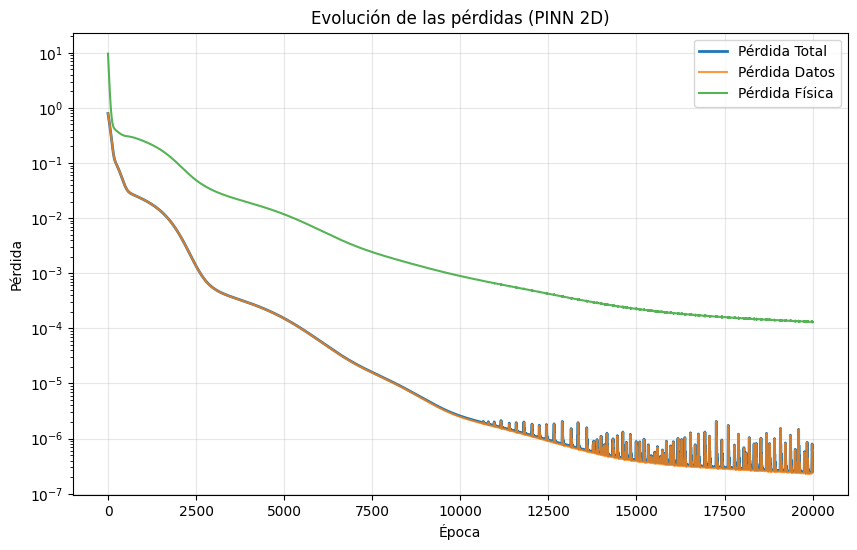

In [ ]:
# ====================== DATOS ======================
t0, T = 0.0, 2.0
X0 = np.array([-1.0, 0.5])

t_full, X_full = rk4_vec(f_vec, t0, X0, T, 1000)

# 10 puntos de datos
idx_data = np.linspace(0, len(t_full)-1, 10, dtype=int)
t_data = t_full[idx_data][:,None]
X_data = X_full[idx_data]

# 20 puntos de física
t_phys = np.linspace(t0, T, 20)[:,None]

# a torch
t_data = torch.tensor(t_data, dtype=torch.float32)
X_data = torch.tensor(X_data, dtype=torch.float32)
t_phys = torch.tensor(t_phys, dtype=torch.float32)

# ====================== ENTRENAMIENTO ======================
model = PINN()

model.train_pinn(
    t_data,
    X_data,
    t_phys,
    f_func=f_vec_torch,
    lambda_phys=1e-4,
    epochs=20000,
    lr=1e-4
)

# ====================== GRAFICO ======================
model.plot_loss()

Se compara la trayectoria obtenida mediante RK4 con la predicción de la PINN, observándose un buen acuerdo global.

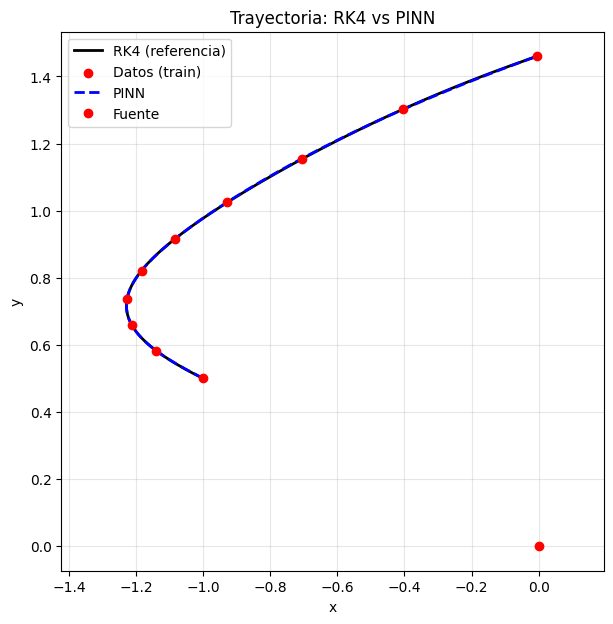

In [ ]:
# ====================== PREDICCION PINN ======================
with torch.no_grad():
    t_plot = torch.tensor(t_full[:,None], dtype=torch.float32)
    X_pred = model.forward(t_plot).numpy()

# ====================== GRAFICO ======================
plt.figure(figsize=(7,7))

# trayectoria real (RK4)
plt.plot(X_full[:,0], X_full[:,1], 'k-', label='RK4 (referencia)', linewidth=2)

# datos usados para entrenar
plt.scatter(X_data[:,0], X_data[:,1], c='red', label='Datos (train)', zorder=3)

# prediccion PINN
plt.plot(X_pred[:,0], X_pred[:,1], 'b--', label='PINN', linewidth=2)

# origen (singularidad)
plt.plot(0,0,'ro',label='Fuente')

plt.xlabel('x')
plt.ylabel('y')
plt.title('Trayectoria: RK4 vs PINN')
plt.legend()
plt.grid(True, alpha=0.3)
plt.axis('equal')

plt.show()

## Punto ii)

Para este inciso se utilizó la red entrenada durante $20000$ épocas para extrapolar la trayectoria más allá del intervalo de entrenamiento $[0,T]$. Se definió el error como:

$\epsilon(t) = \left\| \mathbf{X}_{\mathrm{PINN}}(t) - \mathbf{X}(t) \right\|,$

donde $\mathbf{X}(t)$ corresponde a la solución de referencia obtenida mediante RK4.

Se observa que en el intervalo de entrenamiento $[0,T]$ el error se mantiene bajo, sin embargo, al extrapolar para $t > T$, el error crece progresivamente, esto da a entender que la PINN no es capaz de generalizar el problema mas alla del intervalo de entrenamiento utilizado, por lo tanto se concluye que la red resulta confiable aproximadamente hasta valores de $t \lesssim T$, mientras que para tiempos mayores la precisión se degrada de manera significativa.
En cuanto a los puntos donde X(t) corresponde a un punto de entreneamiento fisico, no son distinguibles a simple vista, esto puede deberse a un entrenamiento muy prolongado que minimiza suavemente los datos entrenados en contraste a los datos del simulador de RK4


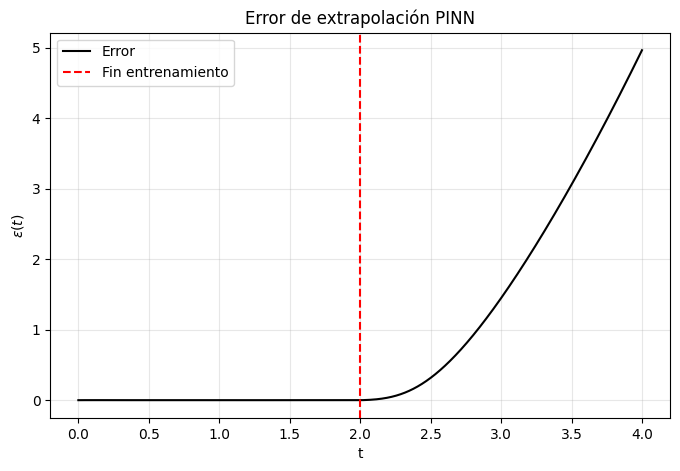

In [ ]:
# ====================== EXTENSION DEL DOMINIO ======================
T_ext = 2*T

t_ext, X_ext = rk4_vec(f_vec, t0, X0, T_ext, 2000)

# predicción PINN
with torch.no_grad():
    t_ext_torch = torch.tensor(t_ext[:,None], dtype=torch.float32)
    X_pred_ext = model.forward(t_ext_torch).numpy()

# ====================== ERROR ======================
error = np.linalg.norm(X_pred_ext - X_ext, axis=1)

# ====================== GRAFICO ======================
plt.figure(figsize=(8,5))
plt.plot(t_ext, error, 'k-', label='Error')
plt.axvline(T, color='r', linestyle='--', label='Fin entrenamiento')
plt.xlabel('t')
plt.ylabel(r'$\epsilon(t)$')
plt.title('Error de extrapolación PINN')
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

Al repetir el entrenamiento utilizando puntos de física uniformemente distribuidos en el intervalo $[0,2T]$, sin modificar su cantidad, se observa una mejora en la extrapolación. En particular, el crecimiento del error más allá de $T$ es más lento, lo que indica que la inclusión de información física en un dominio más amplio permite a la red capturar mejor la dinámica global del sistema.



Epoch     0 | Total: 7.52e-01 | Data: 7.51e-01 | Physics: 1.01e+01
Epoch  2000 | Total: 3.68e-03 | Data: 3.45e-03 | Physics: 2.31e+00
Epoch  4000 | Total: 4.31e-04 | Data: 2.11e-04 | Physics: 2.21e+00
Epoch  6000 | Total: 2.85e-04 | Data: 7.67e-05 | Physics: 2.08e+00
Epoch  8000 | Total: 2.13e-04 | Data: 1.65e-05 | Physics: 1.96e+00
Epoch 10000 | Total: 1.79e-04 | Data: 3.15e-06 | Physics: 1.76e+00
Epoch 12000 | Total: 1.40e-04 | Data: 1.40e-06 | Physics: 1.39e+00
Epoch 14000 | Total: 9.80e-05 | Data: 9.12e-07 | Physics: 9.71e-01
Epoch 16000 | Total: 6.08e-05 | Data: 9.10e-07 | Physics: 5.98e-01
Epoch 18000 | Total: 3.12e-05 | Data: 8.68e-07 | Physics: 3.03e-01
Entrenamiento completado.



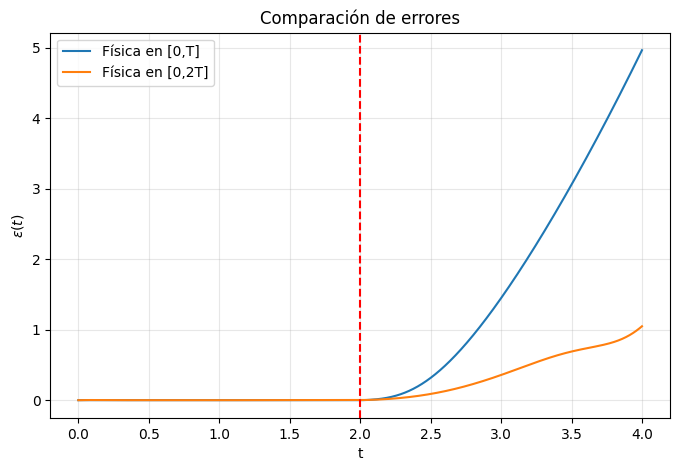

In [ ]:
# nuevos puntos físicos
t_phys_2T = torch.linspace(t0, 2*T, 20).reshape(-1,1)

model2 = PINN()

model2.train_pinn(
    t_data,
    X_data,
    t_phys_2T,
    f_func=f_vec_torch,
    lambda_phys=1e-4,
    epochs=20000,
    lr=1e-4
)

# predicción nueva
with torch.no_grad():
    X_pred_ext2 = model2.forward(t_ext_torch).numpy()

error2 = np.linalg.norm(X_pred_ext2 - X_ext, axis=1)

# comparación
plt.figure(figsize=(8,5))
plt.plot(t_ext, error, label='Física en [0,T]')
plt.plot(t_ext, error2, label='Física en [0,2T]')
plt.axvline(T, color='red', linestyle='--')
plt.xlabel('t')
plt.ylabel(r'$\epsilon(t)$')
plt.title('Comparación de errores')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## Punto iii)

En este inciso se analizó la dependencia del error medio de la PINN con la cantidad de puntos de entrenamiento de datos $N_d$, manteniendo fija la cantidad de puntos de entrenamiento de física en $20$.

Para cada valor de $N_d \in [2,20]$, se entrenó la red durante $20000$ épocas y se calculó el error medio definido como:

$\epsilon_M = \left\langle \epsilon(t_n) \right\rangle = \left\langle \left\| \mathbf{X}_{\mathrm{PINN}}(t_n) - \mathbf{X}(t_n) \right\| \right\rangle.$



In [ ]:
Nd_values = [2, 4, 6, 10, 15, 20]

loss_histories = {}
errors_mean = []

import time

for Nd in Nd_values:

    idx = np.linspace(0, len(t_full)-1, Nd, dtype=int)

    t_data = torch.tensor(t_full[idx][:,None], dtype=torch.float32)
    X_data = torch.tensor(X_full[idx], dtype=torch.float32)

    t_phys = torch.linspace(t0, T, 20).reshape(-1,1)

    model = PINN()

    start = time.time()

    model.train_pinn(
        t_data,
        X_data,
        t_phys,
        f_func=f_vec_torch,
        lambda_phys=1e-4,
        epochs=20000,
        lr=1e-4,
        print_every=20000
    )

    end = time.time()

    # guardar loss total
    loss_histories[Nd] = model.loss_history.copy()

    # error medio
    with torch.no_grad():
        t_eval = torch.tensor(t_full[:,None], dtype=torch.float32)
        X_pred = model.forward(t_eval).numpy()

    error = np.linalg.norm(X_pred - X_full, axis=1)
    errors_mean.append(np.mean(error))

    print(f"Nd={Nd} | error={errors_mean[-1]:.3e} | tiempo={end-start:.1f}s")

Epoch     0 | Total: 9.47e-01 | Data: 9.44e-01 | Physics: 2.27e+01
Entrenamiento completado.

Nd=2 | error=1.552e-02 | tiempo=34.9s
Epoch     0 | Total: 6.98e-01 | Data: 6.97e-01 | Physics: 1.06e+01
Entrenamiento completado.

Nd=4 | error=1.926e-02 | tiempo=30.6s
Epoch     0 | Total: 7.39e-01 | Data: 7.38e-01 | Physics: 9.82e+00
Entrenamiento completado.

Nd=6 | error=1.667e-03 | tiempo=31.0s
Epoch     0 | Total: 1.05e+00 | Data: 1.05e+00 | Physics: 2.43e+01
Entrenamiento completado.

Nd=10 | error=6.441e-04 | tiempo=29.9s
Epoch     0 | Total: 9.10e-01 | Data: 9.08e-01 | Physics: 2.17e+01
Entrenamiento completado.

Nd=15 | error=6.014e-04 | tiempo=30.5s
Epoch     0 | Total: 5.98e-01 | Data: 5.98e-01 | Physics: 1.91e+00
Entrenamiento completado.

Nd=20 | error=4.146e-04 | tiempo=29.2s


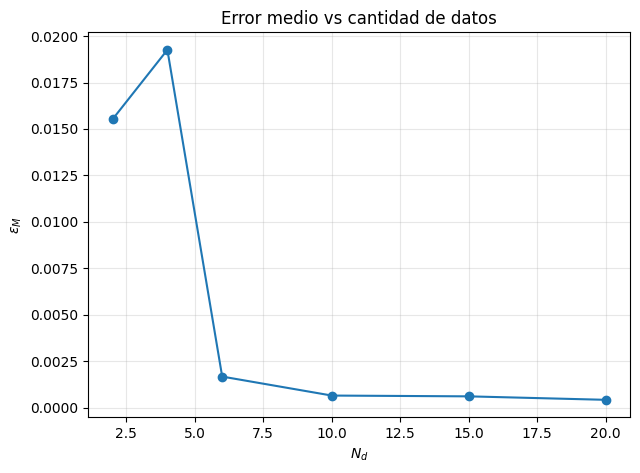

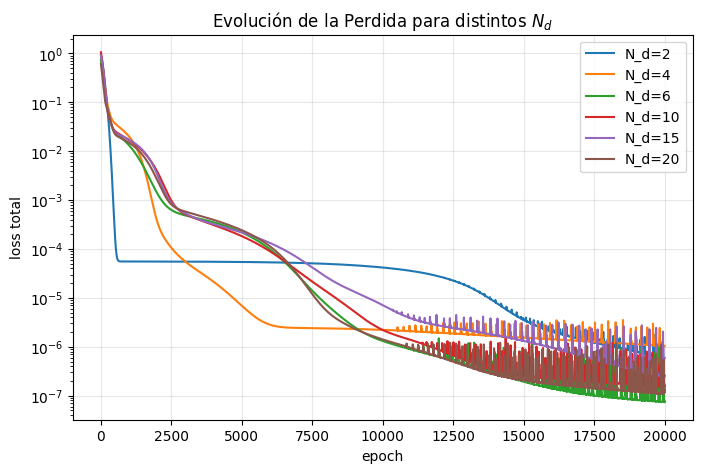

In [ ]:
plt.figure(figsize=(7,5))
plt.plot(Nd_values, errors_mean, 'o-')
plt.xlabel(r'$N_d$')
plt.ylabel(r'$\epsilon_M$')
plt.title('Error medio vs cantidad de datos')
plt.grid(True, alpha=0.3)
plt.show()

plt.figure(figsize=(8,5))
for Nd in Nd_values:
    plt.plot(loss_histories[Nd], label=f'N_d={Nd}')
plt.yscale('log')
plt.xlabel('epoch')
plt.ylabel('loss total')
plt.title('Evolución de la Perdida para distintos $N_d$')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


Se observa que para los primeros valores pequeños de $N_d$ el error es elevado, lo que indica que la red no dispone de suficiente información para reconstruir adecuadamente la trayectoria. Sin embargo a medida que aumenta $N_d$, el error decrece de forma significativa, evidenciando una mejora en la capacidad de ajuste de la red

Adicionalmente, se analizó la evolución de la función de pérdida total para los distintos valores de $N_d$. Se observa que para $N_d = 2$ la convergencia se estanca lo que indica un claro problema de gradiente desvaneciente que impide que a red aprenda mas alla de estos parametros. Esto tiene sentido pues refleja la falta de informacion sobre los datos, y sugiere que aunque la estructura de la PINN sea la correcta si no se tienen datos suficientes para representar el fenomeno sera imposible recrearlo o modelarlo.

Respecto a la cantidad óptima de épocas, no se observan cambios significativos en el orden de magnitud requerido para la convergencia.

## Punto iv)

En este inciso se mantuvo fija la cantidad de puntos de entrenamiento de datos en $N_d = 10$, mientras que se varió la cantidad de puntos de entrenamiento de física $N_f$ en el rango $[5,50]$.

Para cada valor de $N_f$, se entrenó la red durante $20000$ épocas y se calculó el error medio:

$\epsilon_M = \left\langle \left\| \mathbf{X}_{\mathrm{PINN}}(t_n) - \mathbf{X}(t_n) \right\| \right\rangle.$




In [ ]:
Nf_values = [5, 10, 20, 30, 50]

loss_histories_f = {}
errors_mean_f = []

Nd = 10  # fijo

# datos fijos
idx = np.linspace(0, len(t_full)-1, Nd, dtype=int)
t_data = torch.tensor(t_full[idx][:,None], dtype=torch.float32)
X_data = torch.tensor(X_full[idx], dtype=torch.float32)

for Nf in Nf_values:

    # puntos físicos variables
    t_phys = torch.linspace(t0, T, Nf).reshape(-1,1)

    model = PINN()

    model.train_pinn(
        t_data,
        X_data,
        t_phys,
        f_func=f_vec_torch,
        lambda_phys=1e-4,
        epochs=20000,
        lr=1e-4,
        print_every=20000
    )

    # guardar loss total
    loss_histories_f[Nf] = model.loss_history.copy()

    # error medio
    with torch.no_grad():
        t_eval = torch.tensor(t_full[:,None], dtype=torch.float32)
        X_pred = model.forward(t_eval).numpy()

    error = np.linalg.norm(X_pred - X_full, axis=1)
    errors_mean_f.append(np.mean(error))

    print(f"Nf={Nf} -> error medio = {errors_mean_f[-1]:.3e}")

Epoch     0 | Total: 7.82e-01 | Data: 7.80e-01 | Physics: 1.71e+01
Entrenamiento completado.

Nf=5 -> error medio = 5.426e-04
Epoch     0 | Total: 9.74e-01 | Data: 9.71e-01 | Physics: 3.01e+01
Entrenamiento completado.

Nf=10 -> error medio = 8.749e-04
Epoch     0 | Total: 7.91e-01 | Data: 7.88e-01 | Physics: 2.12e+01
Entrenamiento completado.

Nf=20 -> error medio = 7.655e-04
Epoch     0 | Total: 1.17e+00 | Data: 1.17e+00 | Physics: 1.87e+01
Entrenamiento completado.

Nf=30 -> error medio = 3.805e-04
Epoch     0 | Total: 7.04e-01 | Data: 7.03e-01 | Physics: 8.81e+00
Entrenamiento completado.

Nf=50 -> error medio = 5.915e-04


Se observa que para valores pequeños de $N_f$, el error parece ser mas alto, lo que indica que la red no logra incorporar adecuadamente la estructura física del problema y tiende a comportarse como un interpolador de los datos.
Sin embargo estos cambios solo ocurren en las escalas del tercer decimal, por lo que globalmente no hay diferencias apreciables, esto es probablemente al termino lambda de la funcion de perdida pues, $\lambda =  1e-4$ es un valor extremadamente chico,
en general a la red no le importara demasiado el termino fisico a la hora de disminuir su error global, esto es interesante de ver en la evolucion de la funcion de perdida (global), pues esta no depende de la cantidad de los datos de entrenamiento fisico, sino que se comporta de igual manera independiente de la cantidad $N_f$

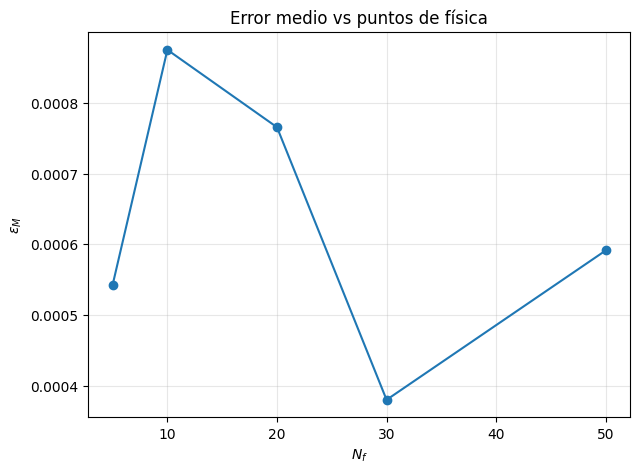

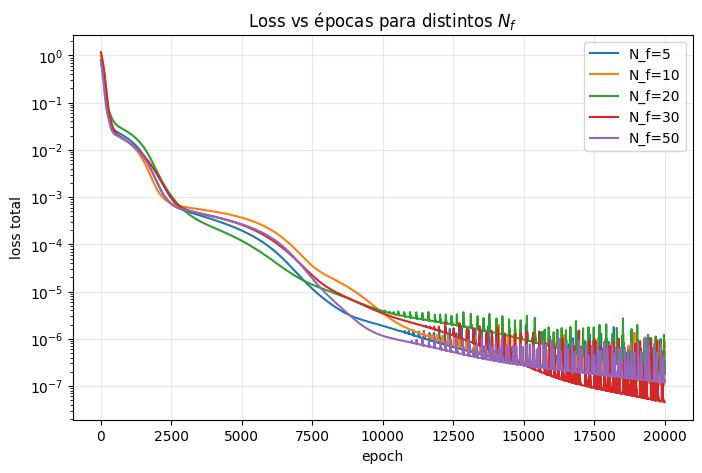

In [ ]:
plt.figure(figsize=(7,5))
plt.plot(Nf_values, errors_mean_f, 'o-')
plt.xlabel(r'$N_f$')
plt.ylabel(r'$\epsilon_M$')
plt.title('Error medio vs puntos de física')
plt.grid(True, alpha=0.3)
plt.show()

plt.figure(figsize=(8,5))

for Nf in Nf_values:
    plt.plot(loss_histories_f[Nf], label=f'N_f={Nf}')

plt.yscale('log')
plt.xlabel('epoch')
plt.ylabel('loss total')
plt.title('Loss vs épocas para distintos $N_f$')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


## Punto v)

En este inciso se analizó la influencia del parámetro $\lambda$ en el entrenamiento de la PINN, manteniendo fijos $N_d = 10$ y $N_f = 20$. Se consideraron valores de $\lambda$ distribuidos logarítmicamente en el intervalo $[10^{-6},10^{-1}]$.

Se evaluó el error medio
$\epsilon_M = \left\langle \left\| \mathbf{X}_{\mathrm{PINN}}(t_n) - \mathbf{X}(t_n) \right\| \right\rangle$
junto con los valores finales de las pérdidas de datos y física.




In [ ]:
lambda_values = np.logspace(-6, -1, 6)
loss_data_final = []
loss_phys_final = []
errors_mean_lambda = []
loss_histories_lambda = {}

Nd = 10
Nf = 20

# ====================== DATOS FIJOS ======================
idx = np.linspace(0, len(t_full)-1, Nd, dtype=int)
t_data = torch.tensor(t_full[idx][:,None], dtype=torch.float32)
X_data = torch.tensor(X_full[idx], dtype=torch.float32)

t_phys = torch.linspace(t0, T, Nf).reshape(-1,1)

# ====================== LOOP ======================
for lam in lambda_values:

    model = PINN()

    model.train_pinn(
        t_data,
        X_data,
        t_phys,
        f_func=f_vec_torch,
        lambda_phys=lam,
        epochs=20000,
        lr=1e-4,
        print_every=20000
    )

    # guardar loss total
    loss_histories_lambda[lam] = model.loss_history.copy()

    # pérdidas finales
    loss_data_final.append(model.loss_data_history[-1])
    loss_phys_final.append(model.loss_physics_history[-1])

    # error medio
    with torch.no_grad():
        t_eval = torch.tensor(t_full[:,None], dtype=torch.float32)
        X_pred = model.forward(t_eval).numpy()

    error = np.linalg.norm(X_pred - X_full, axis=1)
    errors_mean_lambda.append(np.mean(error))

    print(f"lambda={lam:.1e} -> error={errors_mean_lambda[-1]:.3e}")


Epoch     0 | Total: 8.74e-01 | Data: 8.74e-01 | Physics: 3.71e+00
Entrenamiento completado.

lambda=1.0e-06 -> error=7.131e-04
Epoch     0 | Total: 7.97e-01 | Data: 7.97e-01 | Physics: 4.34e+00
Entrenamiento completado.

lambda=1.0e-05 -> error=3.598e-04
Epoch     0 | Total: 7.28e-01 | Data: 7.26e-01 | Physics: 1.49e+01
Entrenamiento completado.

lambda=1.0e-04 -> error=9.248e-04
Epoch     0 | Total: 9.95e-01 | Data: 9.80e-01 | Physics: 1.50e+01
Entrenamiento completado.

lambda=1.0e-03 -> error=7.521e-04
Epoch     0 | Total: 8.55e-01 | Data: 7.87e-01 | Physics: 6.79e+00
Entrenamiento completado.

lambda=1.0e-02 -> error=3.110e-04
Epoch     0 | Total: 2.04e+00 | Data: 7.77e-01 | Physics: 1.26e+01
Entrenamiento completado.

lambda=1.0e-01 -> error=1.351e-03


<>:5: SyntaxWarning: invalid escape sequence '\l'
<>:5: SyntaxWarning: invalid escape sequence '\l'
C:\Users\User\AppData\Local\Temp\ipykernel_22344\325251842.py:5: SyntaxWarning: invalid escape sequence '\l'
  plt.title('Error medio vs $\lambda$')


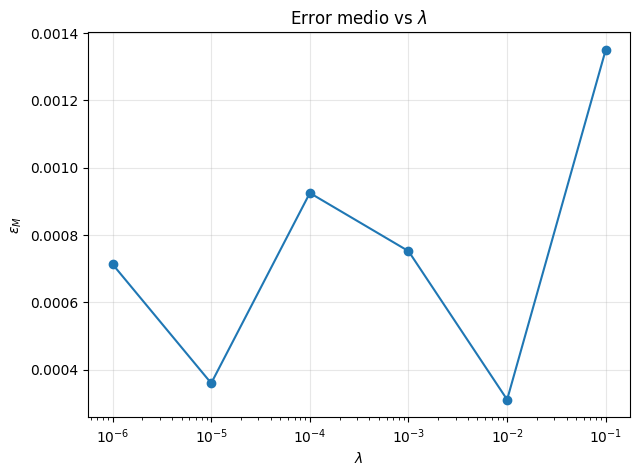

In [ ]:
plt.figure(figsize=(7,5))
plt.semilogx(lambda_values, errors_mean_lambda, 'o-')
plt.xlabel(r'$\lambda$')
plt.ylabel(r'$\epsilon_M$')
plt.title('Error medio vs $\lambda$')
plt.grid(True, alpha=0.3)
plt.show()

Consideramos este resultado bastante interesante, podemos apreciar que $\lambda$ juega un papel crucial para tener un resultado coherente. Ya sabemos que $\lambda$ es un numerito que dice controla "el poder" de la perdida relativa entre el error fisico y el error de los datos, si $\lambda$ es muy chico entonces la funcion de perdida total es igual a la funcion de perdida de datos. Sabemos que la funcion error total se define como 

$$\mathcal{L} = \mathcal{L}_{\text{data}} + \lambda \, \mathcal{L}_{\text{phys}} $$

Entonces si $\lambda\ll1$ podemos aproximar $$\mathcal{L} \approx \mathcal{L}_{\text{data}}$$
Por lo tanto, la red buscara unicamente unir los datos de forma grafica violando toda ley física. Por otro lado, si  $1\ll\lambda$ entonces podemos aproximar $\mathcal{L} \approx\mathcal{L}_{\text{phys}}$ conduciendo a graficas de soluciones triviales o donde se violen las condiciones de controno.

Encontramos un punto medio donde se consderan los 2 ajustes, en el mínimo del error medio exactamente en $\lambda=10^{-2}$ lo consideramos como el punto óptimo de lamda para estas circunstancias.



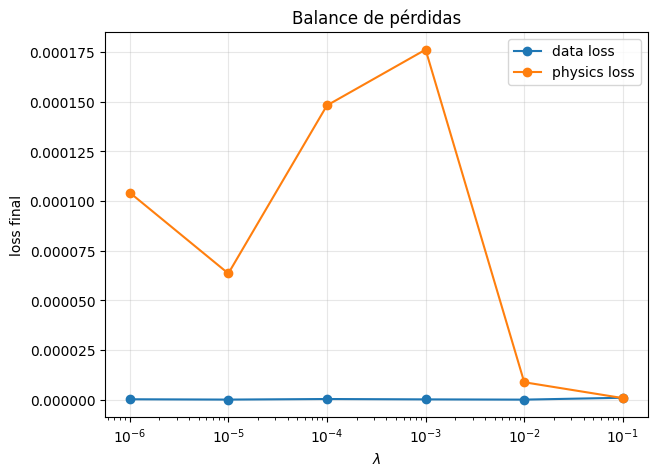

In [ ]:
plt.figure(figsize=(7,5))

plt.semilogx(lambda_values, loss_data_final, 'o-', label='data loss')
plt.semilogx(lambda_values, loss_phys_final, 'o-', label='physics loss')

plt.xlabel(r'$\lambda$')
plt.ylabel('loss final')
plt.title('Balance de pérdidas')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

para confirmar este $\lambda$ óptimo procedemos a graficar para distintos valores. Se puede apreciar que el valor antes mencionado el que menor error produce historicamente.

<>:9: SyntaxWarning: invalid escape sequence '\l'
<>:9: SyntaxWarning: invalid escape sequence '\l'
C:\Users\User\AppData\Local\Temp\ipykernel_22344\1989089055.py:9: SyntaxWarning: invalid escape sequence '\l'
  plt.title('Loss vs épocas para distintos $\lambda$')


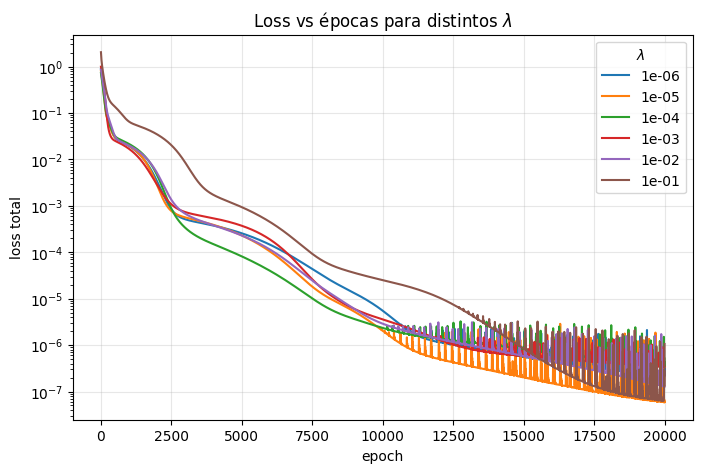

In [ ]:
plt.figure(figsize=(8,5))

for lam in lambda_values:
    plt.plot(loss_histories_lambda[lam], label=f'{lam:.0e}')

plt.yscale('log')
plt.xlabel('epoch')
plt.ylabel('loss total')
plt.title('Loss vs épocas para distintos $\lambda$')
plt.legend(title=r'$\lambda$')
plt.grid(True, alpha=0.3)
plt.show()

## Punto vi)

Para inciso vamos a probar 5 arquitecturas distitntas:

1.   2 capas con 16 neuronas c/u

2.   2 capas con 36 neuronas c/u

3.   2 capas con 64 neuronas c/u

4.   3 capas con 32 neuronas c/u

5.   3 capas con 64 neuronas c/u


fijaron los valores $N_d = 10$, $N_f = 20$ y $\lambda = 10^{-4}$, evaluaremos el desempeño en cada caso.



In [ ]:
Nd = 10
Nf = 20
lambda_phys = 1e-4

architectures = [
    [16,16],
    [32,32],
    [64,64],
    [32,32,32],
    [64,64,64]
]

arch_results = {}
arch_losses = {}

# datos fijos
idx = np.linspace(0, len(t_full)-1, Nd, dtype=int)
t_data = torch.tensor(t_full[idx][:,None], dtype=torch.float32)
X_data = torch.tensor(X_full[idx], dtype=torch.float32)

t_phys = torch.linspace(t0, T, Nf).reshape(-1,1)

for arch in architectures:

    print(f"\nArquitectura: {arch}")

    model = PINN(hidden_sizes=arch)

    model.train_pinn(
        t_data,
        X_data,
        t_phys,
        f_func=f_vec_torch,
        lambda_phys=lambda_phys,
        epochs=20000,
        lr=1e-4,
        print_every=20000
    )

    # guardar loss
    arch_losses[str(arch)] = model.loss_history.copy()

    # error medio
    with torch.no_grad():
        t_eval = torch.tensor(t_full[:,None], dtype=torch.float32)
        X_pred = model.forward(t_eval).numpy()

    error = np.linalg.norm(X_pred - X_full, axis=1)
    arch_results[str(arch)] = np.mean(error)

    print(f"Error medio: {arch_results[str(arch)]:.3e}")


Arquitectura: [16, 16]
Epoch     0 | Total: 1.24e+00 | Data: 1.24e+00 | Physics: 1.30e+01
Entrenamiento completado.

Error medio: 1.534e-03

Arquitectura: [32, 32]
Epoch     0 | Total: 1.32e+00 | Data: 1.31e+00 | Physics: 1.10e+01
Entrenamiento completado.

Error medio: 6.182e-04

Arquitectura: [64, 64]
Epoch     0 | Total: 1.22e+00 | Data: 1.22e+00 | Physics: 1.01e+01
Entrenamiento completado.

Error medio: 4.391e-04

Arquitectura: [32, 32, 32]
Epoch     0 | Total: 9.85e-01 | Data: 9.84e-01 | Physics: 1.64e+01
Entrenamiento completado.

Error medio: 6.760e-04

Arquitectura: [64, 64, 64]
Epoch     0 | Total: 9.17e-01 | Data: 9.13e-01 | Physics: 4.01e+01
Entrenamiento completado.

Error medio: 4.938e-04


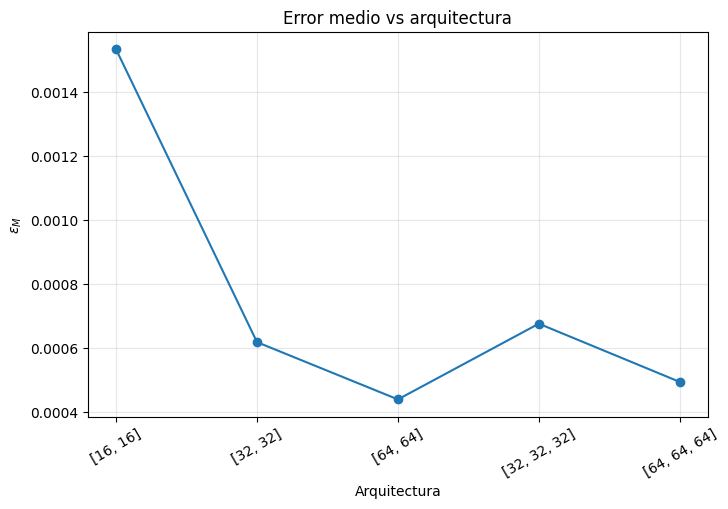

In [ ]:
labels = list(arch_results.keys())
values = list(arch_results.values())

plt.figure(figsize=(8,5))
plt.plot(labels, values, 'o-')
plt.xlabel('Arquitectura')
plt.ylabel(r'$\epsilon_M$')
plt.title('Error medio vs arquitectura')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=30)
plt.show()

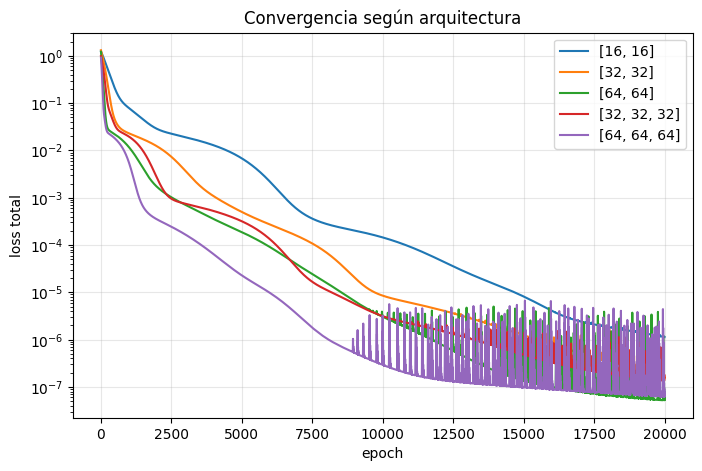

In [ ]:
plt.figure(figsize=(8,5))

for arch in arch_losses:
    plt.plot(arch_losses[arch], label=arch)

plt.yscale('log')
plt.xlabel('epoch')
plt.ylabel('loss total')
plt.title('Convergencia según arquitectura')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

Para entender mejor estos comportameitnos primeros analizamos los casos limite. Parta una arquitectura de [16;16] podemos ver que su desenso no es tan pronunciado como los demas, tambien podemos apreciar un estancamiento y una convergencia prematura hacia ordenes de error de $10^{-6}$.

Por otro lado tenemos un sistema de forma [64;64;64], podemos apreciar que decrece mucho mas rapidamente que sus anteriores modelos, tambien observamos una cinvergencia de errores de valores por debajo de un orden de magnitud de $10^{-7}$ teniendo una mayor presición, sin embargo esta arquitectura es donde el fenómeno de "gradiente explosivo" es mas notable. Esto se puede atribuir a que la propagacion de errores es mucho mayor en aquellos sistemas con mas capas mas densas.

Tomando esta informacion concluimos que la mejor arquitectura será un balance entre estos dos extremos, graficamente podemos elegir us sistema tipo [64;64] o [32;32:32]

# **Problema 4: Estimación de parámetros con PINNs**

Un grupo de Laboratorio 5 elige hacer la mejor práctica de la materia: Fluidos.
En esta práctica, se introduce un agitador magnético para generar un vórtice dentro de un recipiente cilíndrico y se usa el método velocimetría de imágenes de partículas (PIV, por sus siglas en inglés).
Esto permite medir el campo de velocidades $\mathbf{u}(\mathbf{x}, t)$ sobre la superficie, habitualmente modelado mediante el vórtice de Burgers
$$ \mathbf{u}_B(\mathbf{x}, t) = -\alpha r \mathbf{\hat{r}} + \frac{\Gamma}{2\pi r}\left[1 - \exp\left(-r^2/r_0^2\right)\right]\boldsymbol{\hat{\theta}} + 2\alpha z\mathbf{\hat{z}} $$

donde $\Gamma$ es la circulación asintótica del vórtice, $\alpha$ un parámetro que controla el flujo radial y $r_0 = \alpha / 2\nu$ un radio característico del vórtice controlado por la velocidad y la viscosidad.
Dado que se mira la superficie, la componente $z$ suele ignorarse por completo.

Sin embargo, las cámaras de alta velocidad necesarias para hacer PIV no funcionan y no pudieron ser reemplazadas por cuestiones presupuestarias. Ante la desesperación, el grupo decide introducir una pequeña bolita de polietileno dentro del flujo y grabarla con un celular.
Luego, el grupo elige algunos de los cuadros del video donde tanto el centro del vórtice cómo la bolita se ven claramente y, muy laboriosamente, determinan la posición relativa de ambos.
Estos datos se encuentran en el archivo `posiciones.txt`, con la posición $\mathbf{X}(t)$ (en cartesianas) de la boltia respecto al vórtice (que se considera en el origen) para los $t$ indicados. Las distancias están medidas en centimetros y el tiempo en segundos.

Entrene una PINN que ajuste la trayectoria mediante el modelo de Burgers $\dot{\mathbf{X}} = \mathbf{u}_B(\mathbf{X}, t)$ y aprenda los parámetros $\alpha$, $\Gamma$ y $r_0$. La predicción de la PINN debe coincidir con los datos provistos en una trayectoria aproximadamente espiralada, cómo mínimo. Puede usar el siguiente esqueleto, que además contiene estimaciones del orden de magnitud de los distintos parámetros hechos por el grupo. Los parámetros propuestos no son necesariamente óptimos, es libre de cambiarlos todos.

**Nota:** Por simplicidad, ignoraremos los errores en la medición de estos datos, pero podrían incluirse cómo un término adicional de la función de pérdida.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Cargar datos
!pip install -q gdown
!gdown 1USjbT0fCDREgM0KIFsn_9JCvcA7jBXuD -O posiciones.txt

t_data, x_data, y_data = np.loadtxt("posiciones.txt", unpack=True)



Downloading...
From: https://drive.google.com/uc?id=1USjbT0fCDREgM0KIFsn_9JCvcA7jBXuD
To: /content/posiciones.txt
100% 1.52k/1.52k [00:00<00:00, 6.60MB/s]


Voy a querer armarme una PINN que contenga dentro de su funcion de perdida fisica el modelo de vorticidad de Burgers, sin embargo el fordward necesario debe ser necesariamente los parametros a controlar, de modo que el sistema aprenda a "elejir" estos parametros

 Este problema es ligereamente distinto al resto, ya que se nos presenta una
serie de datos que son los que obtuvo el grupo de laboratorio expuestos en el archivo (`posiciones.txt`)  y usaremos la red neuronal para que ajuste los parámetros físicos $(\alpha, \Gamma, r_0)$
uniendo los datos con trayectorias que satisfagan las ecuaciones diferenciales.
Comenzamos llamando las librerías necesarias y definiendo nuestra PINN a través de $classPINN$ reutilizando el esqueleto del código del punto anterior.
Como se comentó anteriormente, buscamos entrenar a nuestra red minimizando una funcion que llamamos la "función de perdida total" denotada por $\mathcal{L}$, la cual se define como:
 $$\mathcal{L} = \mathcal{L}_{\text{data}} + \lambda\,\mathcal{L}_{\text{phys}}$$

En éste caso nuestra entrada está definida por una neurona, que corresponde a la unica variable independiente, el **tiempo**. Se definió en la parte de ***"hidden sizes***" las capas ocultas, que estan compuestas por 3 etapas cada una con 32 neuronas las cuales son las que entrenaremos, y por ultimo contamos con la salida que es bidimensional con 2 neuronas que corresponden a las variables en polares ($r(t); \theta(t)$).

Luego viene una parte de crucial importancia, como mencionamos antes los parametros que queremos ajustar son $$(\alpha, \Gamma, r_0)$$ por lo tanto, estas cantidades **NO** deben estar igualadas a alguna cantidad ya que sino el codigo las contemplaría como fijas. Para este problema precisamente, buscamos variar estas cantidades para que se ajusten a nuestro modelo físico descrito por las ecuaciones diferenciales. En el código se expresa entre cortchetes [] el valor inicial de estas cantidades en torno a las que el programa las ajustará.

### Explicación del enfoque con PINN

Por lo tanto en lugar de resolver una ecuación diferencial conocida, contamos con datos experimentales de la trayectoria de una bolita en un vórtice. El objetivo central de este trabajo es utilizar una **Physics-Informed Neural Network (PINN)** para ajustar simultáneamente la trayectoria observada $r(t)$ y $\theta(t)$ (coordenadas polares) y los parámetros físicos desconocidos del modelo del vórtice de Burgers: $\alpha$, $\Gamma$ y $r_0$. Y a su vez las derivadas temporales satisfagan las ecuaciones diferenciales del modelo de Burgers (pérdida física).

De esta forma, la red no solo interpola la trayectoria, sino que **aprende** los parámetros físicos que mejor explican el movimiento observado.

#### 1. Preparación de los datos

Primero cargamos los datos experimentales que contienen las posiciones $(x(t), y(t))$ de la bolita. Luego convertimos estas posiciones a coordenadas polares:
- $r(t) = \sqrt{x^2 + y^2}$
- $\theta(t) = arctan(y, x)$

Dado que la partícula realiza aproximadamente **2.5 revoluciones**, aplicamos `np.unwrap()` al ángulo para obtener un $\theta(t)$ continuo y creciente (sin saltos de $2\pi$).

Posteriormente, realizamos una **normalización** de las variables $t$, $r$ y $\theta$. Esto es fundamental para mejorar la estabilidad numérica y el balance entre las distintas escalas (el ángulo desenrollado alcanza valores mucho mayores que el radio).

#### 2. Definición de la PINN

Definimos la red neuronal a través de la clase `PINN`. La arquitectura es la siguiente:

- **Entrada**: 1 neurona correspondiente al tiempo $t$ (normalizado).
- **Capas ocultas**: 3 capas densas con 32 neuronas cada una, utilizando la función de activación $\tanh$.
- **Salida**: 2 neuronas que representan las variables normalizadas $r_{\text{norm}}(t)$ y $\theta_{\text{norm}}(t)$.

Los parámetros físicos que deseamos estimar ($\alpha$, $\Gamma$ y $r_0$) se definen como **parámetros entrenables** (`torch.nn.Parameter`). A diferencia de las redes convencionales, estos valores **no son fijos**: el optimizador los ajustará durante el entrenamiento junto con los pesos de la red. Se inicializan con valores razonables basados en estimaciones previas:
- $\alpha \approx 0.075$
- $\Gamma \approx 710$ (usamos $\log(\Gamma)$ para mantenerlo positivo)
- $r_0 \approx 0.60$

#### 3. Función de pérdida

La red se entrena minimizando la **función de pérdida total**:

$$
\mathcal{L} = \mathcal{L}_{\text{data}} + \lambda \, \mathcal{L}_{\text{phys}}
$$

donde:
- $\mathcal{L}_{\text{data}}$ mide el error cuadrático medio entre la predicción de la red y los datos normalizados de $(r, \theta)$.
- $\mathcal{L}_{\text{phys}}$ es el residual de las ecuaciones diferenciales del vórtice de Burgers. Se calcula utilizando `autograd` para obtener las derivadas $\frac{dr}{dt}$ y $\frac{d\theta}{dt}$ y compararlas con las expresiones teóricas:
  $$
  \frac{dr}{dt} = -\alpha r, \qquad \frac{d\theta}{dt} = \frac{\Gamma}{2\pi r^2} \left(1 - e^{-r^2/r_0^2}\right)
  $$

El factor $\lambda$ permite balancear la importancia relativa entre ajustarse a los datos y respetar la física.

#### 4. Entrenamiento

Durante el entrenamiento, la red aprende simultáneamente:
- A reproducir la trayectoria observada.
- A satisfacer las ecuaciones diferenciales del modelo.
- Los valores óptimos de los parámetros $\alpha$, $\Gamma$ y $r_0$.

Al finalizar, los valores obtenidos de estos parámetros representan la estimación física más consistente con los datos experimentales bajo el modelo de Burgers.


Normalización aplicada:
t     → mean=2.8517, std=1.7407
r     → mean=3.7114, std=0.1598
theta → mean=7.4771, std=4.7825

Epoch     0 | Total 1.11e+01 | Data 1.01e+00 | Phys 6.74e-01 | α=0.07440  Γ=50.0  r0=0.6000
Epoch  2000 | Total 3.63e-01 | Data 3.62e-01 | Phys 8.12e-05 | α=0.04298  Γ=60.7  r0=0.6000
Epoch  4000 | Total 2.22e-01 | Data 2.21e-01 | Phys 3.75e-05 | α=0.04324  Γ=137.1  r0=0.6000
Epoch  6000 | Total 2.80e-02 | Data 2.76e-02 | Phys 2.73e-05 | α=0.04325  Γ=314.5  r0=0.6000
Epoch  8000 | Total 1.67e-03 | Data 1.59e-03 | Phys 5.69e-06 | α=0.04317  Γ=389.2  r0=0.6000
Epoch 10000 | Total 2.55e-04 | Data 2.28e-04 | Phys 1.76e-06 | α=0.04314  Γ=406.6  r0=0.6000
Epoch 12000 | Total 1.90e-04 | Data 1.72e-04 | Phys 1.17e-06 | α=0.04314  Γ=410.1  r0=0.6000
Epoch 14000 | Total 1.81e-04 | Data 1.69e-04 | Phys 8.10e-07 | α=0.04314  Γ=410.8  r0=0.6000
Epoch 16000 | Total 1.79e-04 | Data 1.69e-04 | Phys 6.96e-07 | α=0.04314  Γ=410.9  r0=0.6000
Epoch 18000 | Total 3.35e-04 | Data 1.69e-04

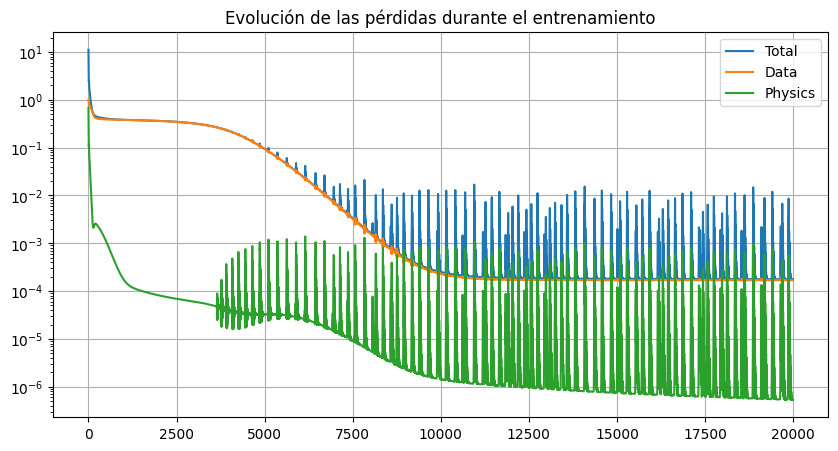

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt

# ====================== DATOS ======================
t_data_np, x_data, y_data = np.loadtxt("posiciones.txt", unpack=True)

r_data = np.sqrt(x_data**2 + y_data**2)
theta_data = np.arctan2(y_data, x_data)
theta_unwrapped = np.unwrap(theta_data)

# ====================== NORMALIZACIÓN ======================
t_mean = t_data_np.mean()
t_std  = t_data_np.std()
r_mean = r_data.mean()
r_std  = r_data.std()
theta_mean = theta_unwrapped.mean()
theta_std  = theta_unwrapped.std()

print(f"Normalización aplicada:")
print(f"t     → mean={t_mean:.4f}, std={t_std:.4f}")
print(f"r     → mean={r_mean:.4f}, std={r_std:.4f}")
print(f"theta → mean={theta_mean:.4f}, std={theta_std:.4f}\n")

t_data = torch.tensor(t_data_np[:, None], dtype=torch.float32)
t_norm = (t_data - t_mean) / t_std

rtheta_norm = torch.stack([
    (torch.tensor(r_data, dtype=torch.float32) - r_mean) / r_std,
    (torch.tensor(theta_unwrapped, dtype=torch.float32) - theta_mean) / theta_std
], dim=1)

t_phys = torch.linspace(t_data.min().item(), t_data.max().item(), 250).reshape(-1, 1)
t_phys_norm = (t_phys - t_mean) / t_std


class PINN(torch.nn.Module):
    def __init__(self, hidden_sizes=[32, 32, 32]):
        super().__init__()
        layers = [1] + hidden_sizes + [2]
        self.layers = torch.nn.ModuleList([torch.nn.Linear(layers[i], layers[i+1])
                                          for i in range(len(layers)-1)])

        # Inicialización cercana a los valores estimados
        self.alpha = torch.nn.Parameter(torch.tensor([0.075]))
        self.log_Gamma = torch.nn.Parameter(torch.tensor([np.log(50)]))
        self.r0 = torch.nn.Parameter(torch.tensor([0.6]))

        # Guardamos normalización
        self.register_buffer('t_mean', torch.tensor(t_mean))
        self.register_buffer('t_std',  torch.tensor(t_std))
        self.register_buffer('r_mean', torch.tensor(r_mean))
        self.register_buffer('r_std',  torch.tensor(r_std))
        self.register_buffer('theta_mean', torch.tensor(theta_mean))
        self.register_buffer('theta_std',  torch.tensor(theta_std))

        self.loss_history = []
        self.loss_data_history = []
        self.loss_phys_history = []

    def forward(self, t):
        x = t
        for layer in self.layers[:-1]:
            x = torch.tanh(layer(x))
        return self.layers[-1](x)

    def denormalize(self, pred_norm): # Funcion para desnormalizar los parametros a la salida
        r_norm = pred_norm[:, 0:1]
        theta_norm = pred_norm[:, 1:2]
        r = r_norm * self.r_std + self.r_mean
        theta = theta_norm * self.theta_std + self.theta_mean
        return r, theta

    def burgers_rhs(self, r):
        drdt = -self.alpha * r
        Gamma = torch.exp(self.log_Gamma)
        r_safe = torch.clamp(r, min=1e-4)
        dthetadt = (Gamma / (2 * torch.pi * r_safe**2)) * \
                   (1 - torch.exp(-(r_safe**2) / (self.r0**2)))
        return drdt, dthetadt

    def data_loss(self, t_data, rtheta_data):
        pred = self.forward(t_data)
        return torch.mean((pred - rtheta_data)**2)

    def physics_loss(self, t_phys):
        t_phys = t_phys.requires_grad_(True)
        pred = self.forward(t_phys)
        r, theta = self.denormalize(pred)

        drdt = torch.autograd.grad(r, t_phys, torch.ones_like(r), create_graph=True)[0]
        dthetadt = torch.autograd.grad(theta, t_phys, torch.ones_like(theta), create_graph=True)[0]

        drdt_rhs, dthetadt_rhs = self.burgers_rhs(r)

        return torch.mean((drdt - drdt_rhs)**2 + (dthetadt - dthetadt_rhs)**2)

    def total_loss(self, t_data, rtheta_data, t_phys, lambda_phys=10.0):
        ld = self.data_loss(t_data, rtheta_data)
        lp = self.physics_loss(t_phys)
        return ld + lambda_phys * lp, ld, lp

    def train_pinn(self, t_data, rtheta_data, t_phys, epochs=20000, lr=1e-3, lambda_phys=10.0):
        optimizer = torch.optim.Adam(self.parameters(), lr=lr)

        for epoch in range(epochs):
            optimizer.zero_grad()
            loss, ld, lp = self.total_loss(t_data, rtheta_data, t_phys, lambda_phys)
            loss.backward()
            optimizer.step()

            self.loss_history.append(loss.item())
            self.loss_data_history.append(ld.item())
            self.loss_phys_history.append(lp.item())

            if epoch % 2000 == 0:
                Gamma_val = torch.exp(self.log_Gamma).item()
                print(f"Epoch {epoch:5d} | Total {loss.item():.2e} | Data {ld.item():.2e} | "
                      f"Phys {lp.item():.2e} | α={self.alpha.item():.5f}  Γ={Gamma_val:.1f}  r0={self.r0.item():.4f}")

        print("\nEntrenamiento finalizado")
        print(f"alpha = {self.alpha.item():.5f}")
        print(f"Gamma = {torch.exp(self.log_Gamma).item():.1f}")
        print(f"r0    = {self.r0.item():.4f}")

    def plot_loss(self):
        plt.figure(figsize=(10,5))
        plt.plot(self.loss_history, label='Total')
        plt.plot(self.loss_data_history, label='Data')
        plt.plot(self.loss_phys_history, label='Physics')
        plt.yscale('log')
        plt.legend()
        plt.grid()
        plt.title("Evolución de las pérdidas durante el entrenamiento")
        plt.show()


# ====================== EJECUCIÓN ======================
model = PINN()
model.train_pinn(t_norm, rtheta_norm, t_phys_norm, epochs=20000, lr=6e-4, lambda_phys=15.0)
model.plot_loss()


Éste fenómeno obserbable en los picos es un problema bien conocido y estudiado en estos temas, se llama **gradiente explosivo**.
Para entrender este fenómeno matematicamente es necesario ver como influye un error en alguna capa L a las capas anteriores. Haciendo propagacion de errores, que no es mas que Calcular el gradiente de la funcion error, se puede llegar a una formula de recurrencia, en donde se aprecia una retroalimentaión resonante  haciendo que el gradiente diverja.
Mas alla de esto, podemos apreciar que el sitema arrojó unos valores mas o menos esperados de nuestros parametros.

Haciendo varias pruebas modificando  incluso los órdenes de magnitud de nuestros valores iniciales $(\alpha, \Gamma, r_0)$ obervamos que el sistema siempre encuentra un mínimo local en torno a:


*   $\Gamma$ $\approx$ 410
*   $\alpha$ $\approx$ 0.6
*   $r_0$ $\approx$ 0.043

Ahora, nos disponemos a analizar cómo sería la trayectoria de una partícula sumergida en base a los parámetros encontrados anteriormente. Realizarémos a continuación una simulación en base al metodo de euler, graficando la trayectoria obtenida con los datos reales del experimento.





=== ANÁLISIS VISUAL CON PARÁMETROS APRENDIDOS ===


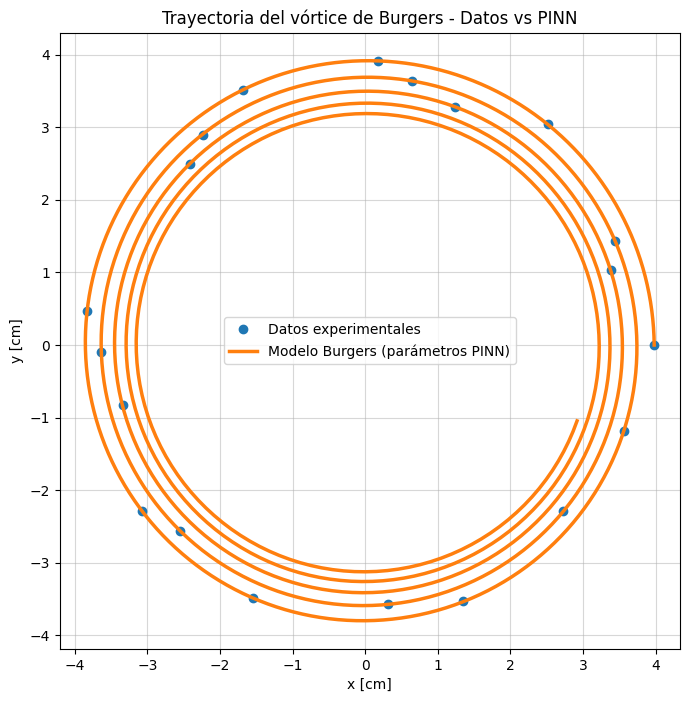

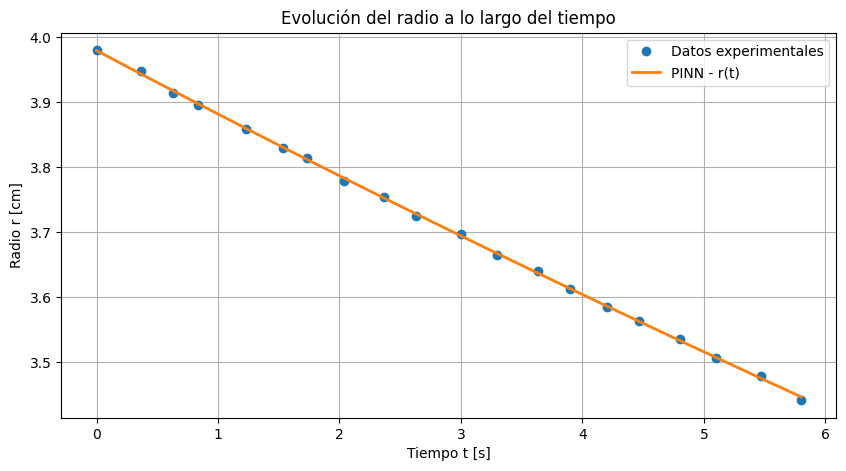

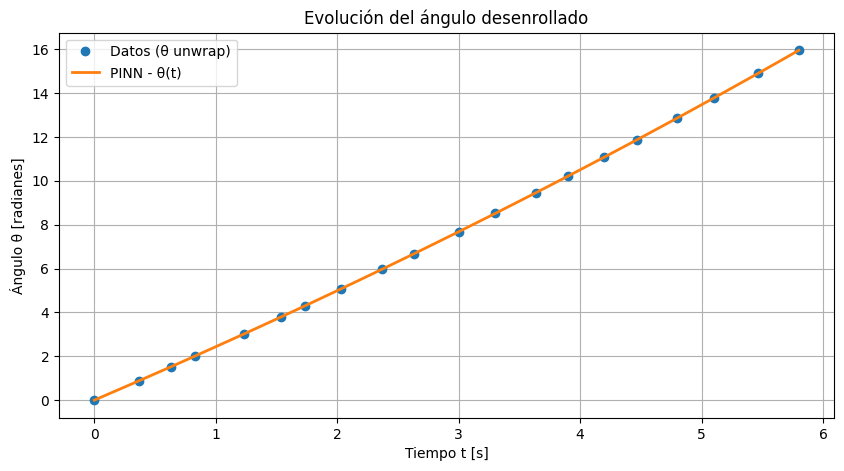

Visualización completada.
Parámetros finales usados: α = 0.04314, Γ = 411.0, r0 = 0.6000


In [ ]:

# ====================== ANÁLISIS Y VISUALIZACIÓN CON PARÁMETROS PINN ======================

print("\n=== ANÁLISIS VISUAL CON PARÁMETROS APRENDIDOS ===")

alpha = model.alpha.item()
Gamma = torch.exp(model.log_Gamma).item()
r0 = model.r0.item()

# Simulación Euler para extrapolar la trayectoria
t_sim = np.linspace(t_data_np[0], t_data_np[-1], 800)
dt = t_sim[1] - t_sim[0]

r_sim = np.zeros_like(t_sim)
theta_sim = np.zeros_like(t_sim)

r_sim[0] = r_data[0]
theta_sim[0] = theta_unwrapped[0]

for i in range(len(t_sim)-1):
    r = max(r_sim[i], 1e-6)
    drdt = -alpha * r
    dthetadt = (Gamma / (2 * np.pi * r**2)) * (1 - np.exp(-(r**2) / r0**2))

    r_sim[i+1] = r + drdt * dt
    theta_sim[i+1] = theta_sim[i] + dthetadt * dt

x_sim = r_sim * np.cos(theta_sim)
y_sim = r_sim * np.sin(theta_sim)

# Gráfico 1: Trayectoria espiral en el plano x-y
plt.figure(figsize=(8, 8))
plt.plot(x_data, y_data, 'o', markersize=6, label="Datos experimentales")
plt.plot(x_sim, y_sim, '-', linewidth=2.5, label="Modelo Burgers (parámetros PINN)")
plt.axis('equal')
plt.grid(True, alpha=0.5)
plt.xlabel("x [cm]")
plt.ylabel("y [cm]")
plt.title("Trayectoria del vórtice de Burgers - Datos vs PINN")
plt.legend()
plt.show()

# Gráfico 2: Evolución del radio r(t)
with torch.no_grad():
    pred_norm = model.forward(t_norm)
    r_pred = (pred_norm[:, 0].numpy() * r_std + r_mean)

plt.figure(figsize=(10, 5))
plt.plot(t_data_np, r_data, 'o', label="Datos experimentales")
plt.plot(t_data_np, r_pred, '-', linewidth=2, label="PINN - r(t)")
plt.xlabel("Tiempo t [s]")
plt.ylabel("Radio r [cm]")
plt.grid(True)
plt.legend()
plt.title("Evolución del radio a lo largo del tiempo")
plt.show()

# Gráfico 3: Evolución del ángulo θ(t) desenrollado
with torch.no_grad():
    theta_pred_norm = model.forward(t_norm)[:, 1].numpy()
    theta_pred = theta_pred_norm * theta_std + theta_mean

plt.figure(figsize=(10, 5))
plt.plot(t_data_np, theta_unwrapped, 'o', label="Datos (θ unwrap)")
plt.plot(t_data_np, theta_pred, '-', linewidth=2, label="PINN - θ(t)")
plt.xlabel("Tiempo t [s]")
plt.ylabel("Ángulo θ [radianes]")
plt.grid(True)
plt.legend()
plt.title("Evolución del ángulo desenrollado")
plt.show()

print("Visualización completada.")
print(f"Parámetros finales usados: α = {alpha:.5f}, Γ = {Gamma:.1f}, r0 = {r0:.4f}")

Se puede observar a simple vista una espiral como se nos pedia en el ejercicio. Para confirmar esto podemos ver como se relacionan las coordenadas $r$ y $\theta$ y se puede ver que se relacionan mediante una ecuacion lineal, la cual corresponde a la ecuacion polar de una esprial.